# Feature Engineering

In [2]:
import pandas as pd
from tqdm import tqdm


In [ ]:
df_1 = pd.read_excel('data_pvk_dualmodel.xlsx')

In [4]:
columns_del = ['时间','T80','T95','DOI','perovskite_layer','pce_percent']
df_1.drop(columns_del,axis=1,inplace=True)

In [5]:
# generate Temperature, RH, Sun
df_1[['Temperature', 'RH', 'Sun']] = df_1['test_condition'].str.split('-', expand=True)[[0, 1, 2]]

# delete origin 'Feature'
df_1.drop(columns=['test_condition'], inplace=True)

## onehot encoding method

In [6]:
df_onehot = df_1.copy()

In [7]:
df_onehot['HTL'].value_counts().head(40)

HTL
Spiro-OMeTAD      1106
NiOx               219
PTAA               197
PEDOT:PSS          153
no                 114
MeO-2PACz           44
P3HT                21
P3CT-N              16
FTPE-OSMe           15
MeO-4PACz           13
P3HT-COOH           12
2PACz               11
NiMgLiO             10
Cu:NiOx             10
P3CT                 8
Me-4PACz             6
P3CT-Cs              6
Me-4PACz:2PACz       4
T-2TPA               4
D-OC6                4
Ph-4PACz             4
T-6TPA               4
PM6                  3
FTPE-OMe             3
D-C6                 3
MCz-VPOZ             3
L3                   3
L1                   3
BD                   3
L2                   3
ZS13                 3
MeO-PhPACz           3
MD                   3
FTPE-ST              2
9CPA                 2
BDT-DPA-F            2
Spiro-cyclOMe        2
9CAA                 2
MeO-BTBT             2
TPA-CAA              2
Name: count, dtype: int64

In [8]:
# SAM material
list_sam = ['MeO-2PACz','2PACz','MeO-4PACz','Me-4PACz','Ph-4PACz','MeO-PhPACz','MeO-BTBT','TPA-CAA',
        'TPA-AA','9CAA','9CPA','MCz-VPOZ','MPA-BT-BA','MPA-2FBT-BA','4-PCA','MeO-2PACz:2PACz','MeO-4PACz:2PACz','Me-4PACz:NA','3-TA','BA','HC-A4']

In [9]:
for index in tqdm(range(df_onehot.shape[0])):
    if df_onehot.loc[index,'HTL'] == 'Spiro-OMeTAD':
        df_onehot.loc[index,'HTL_spiro'] = 1
    elif df_onehot.loc[index,'HTL'] == 'NiOx':
        df_onehot.loc[index,'HTL_NiOx'] = 1
    elif df_onehot.loc[index,'HTL'] == 'PTAA':
        df_onehot.loc[index,'HTL_PTAA'] = 1
    elif df_onehot.loc[index,'HTL'] == 'PEDOT:PSS':
        df_onehot.loc[index,'HTL_PEDOT'] = 1
    elif df_onehot.loc[index,'HTL'] == 'no':
        df_onehot.loc[index,'HTL_no'] = 1
    elif df_onehot.loc[index,'HTL'] in list_sam:
        df_onehot.loc[index,'HTL_SAM'] = 1
    elif df_onehot.loc[index,'HTL'] == 'P3HT':
        df_onehot.loc[index,'HTL_P3HT'] = 1
    elif df_onehot.loc[index,'HTL'] == 'P3CT-N':
        df_onehot.loc[index,'HTL_P3CT'] = 1    
    elif df_onehot.loc[index,'HTL'] == 'P3CT':
        df_onehot.loc[index,'HTL_P3CT'] = 1 
    elif df_onehot.loc[index,'HTL'] == 'P3CT-Cs':
        df_onehot.loc[index,'HTL_P3CT'] = 1 
    else:
        df_onehot.loc[index,'HTL_others'] = 1
df_onehot.fillna(0,inplace=True)
df_onehot

  0%|          | 0/2078 [00:00<?, ?it/s]

100%|██████████| 2078/2078 [00:00<00:00, 4113.46it/s]


,stable_eff,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,...,Sun,HTL_others,HTL_NiOx,HTL_spiro,HTL_PTAA,HTL_SAM,HTL_P3CT,HTL_PEDOT,HTL_no,HTL_P3HT
0,25.705640,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,25.762130,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,100,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,26.006736,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,25.649090,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,100,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,23.080356,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,...,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,19.280737,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,...,100,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2074,17.714514,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,100,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2075,10.655580,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,100,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2076,17.709440,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,...,100,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [10]:
df_onehot["HTL-2"].value_counts().head(10)

HTL-2
no              1926
PTAA              66
Me-4PACz          31
2PACz             21
MeO-2PACz          6
PMMA:F4-TCNQ       6
MeO-4PACz          4
PMMA               3
4-PCA              2
Me-4PACz:NA        2
Name: count, dtype: int64

In [11]:
for index in tqdm(range(df_onehot.shape[0])):
    if df_onehot.loc[index,'HTL-2'] == 'PTAA':
        df_onehot.loc[index,'HTL2_PTAA'] = 1
    elif df_onehot.loc[index,'HTL-2'] in list_sam:
        df_onehot.loc[index,'HTL2_SAM'] = 1
    if (df_onehot.loc[index,'HTL-2'] in list_sam) & (df_onehot.loc[index,'HTL'] == 'NiOx'):
        df_onehot.loc[index,'NiOx/SAM'] = 1
    elif (df_onehot.loc[index,'HTL-2'] in list_sam) & (df_onehot.loc[index,'HTL'] != 'NiOx'):
        df_onehot.loc[index,'OtherHTL/SAM'] = 1
    elif (df_onehot.loc[index,'HTL-2'] !='no') & (df_onehot.loc[index,'HTL'] == 'NiOx') & (df_onehot.loc[index,'HTL'] not in list_sam):
        df_onehot.loc[index,'NiOx/PTAA'] = 1
    elif df_onehot.loc[index,'HTL-2'] == 'no':
        df_onehot.loc[index,'HTL2_no'] = 1
    else:
        df_onehot.loc[index,'HTL2_others'] = 1

df_onehot.fillna(0,inplace=True)
df_onehot

  0%|          | 0/2078 [00:00<?, ?it/s]

100%|██████████| 2078/2078 [00:00<00:00, 3429.73it/s]


,stable_eff,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,...,HTL_PEDOT,HTL_no,HTL_P3HT,HTL2_no,HTL2_SAM,NiOx/SAM,HTL2_PTAA,NiOx/PTAA,OtherHTL/SAM,HTL2_others
0,25.705640,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,25.762130,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,26.006736,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
3,25.649090,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
4,23.080356,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,19.280737,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2074,17.714514,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
2075,10.655580,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
2076,17.709440,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [12]:
df_onehot['HTL_add'] = df_onehot['HTL_add'].str.replace('LiTFSI  + FK209', 'LiTFSI + FK209', regex=False)

In [13]:
count = df_onehot['HTL_add'].str.startswith('LiTFSI +').sum()
count

np.int64(1129)

In [14]:
for index in tqdm(range(df_onehot.shape[0])):
    if df_onehot.loc[index,'HTL_add'] == 'LiTFSI + tBP':
        df_onehot.loc[index,'HTLadd_li&tbp'] = 1
    elif df_onehot.loc[index,'HTL_add'] == 'LiTFSI + tBP + FK209':
        df_onehot.loc[index,'HTLadd_li&tbp&co'] = 1
    elif df_onehot.loc[index,'HTL_add'].startswith('LiTFSI + tBP +'):
        df_onehot.loc[index,'HTLadd_li&tbp&others'] = 1
    elif df_onehot.loc[index,'HTL_add'] == 'F4TCNQ':
        df_onehot.loc[index,'HTLadd_f4tcnq'] = 1
    elif df_onehot.loc[index,'HTL_add'] == 'no':
        df_onehot.loc[index,'HTLadd_no'] = 1
    else:
        df_onehot.loc[index,'HTLadd_others'] = 1
df_onehot.fillna(0,inplace=True)
df_onehot

100%|██████████| 2078/2078 [00:00<00:00, 4637.82it/s]


,stable_eff,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,...,HTL2_PTAA,NiOx/PTAA,OtherHTL/SAM,HTL2_others,HTLadd_no,HTLadd_li&tbp,HTLadd_li&tbp&co,HTLadd_li&tbp&others,HTLadd_others,HTLadd_f4tcnq
0,25.705640,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,25.762130,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,26.006736,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,25.649090,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,23.080356,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,19.280737,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2074,17.714514,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2075,10.655580,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2076,17.709440,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [15]:
df_onehot["ETL"].value_counts()

ETL
SnO2             941
PC61BM           351
C60              298
TiO2             198
cTiO2_spray      111
cTiO2_SP          43
PC61BM:C60        41
cTiO2_ALD         28
ZnO               16
PC61BM/C60        12
LiF_TE/C60        11
cTiO2_CBD          7
PC71BM             6
SnO2 QDs-TQDs      3
PC61BM:EVA         3
BBIN-2/C60         2
BBIN-3/C60         2
BBIN-1/C60         2
ICBA               2
SnO2:ACDs          1
Name: count, dtype: int64

In [16]:
for index in tqdm(range(df_onehot.shape[0])):
    if (df_onehot.loc[index,'ETL'] == 'SnO2') & (df_onehot.loc[index,'ETL_add'] == 'no'):
        df_onehot.loc[index,'ETL_SnO2'] = 1
    elif (df_onehot.loc[index,'ETL'] == 'SnO2') or ('SnO2' in df_onehot.loc[index,'ETL']):
        df_onehot.loc[index,'ETL_SnO2_doped'] = 1
    elif (df_onehot.loc[index,'ETL'] == 'cTiO2_spray') & (df_onehot.loc[index,'ETL_add'] == 'no'):
        df_onehot.loc[index,'ETL_cTiO2_spray'] = 1
    elif (df_onehot.loc[index,'ETL'] == 'cTiO2_spray') & (df_onehot.loc[index,'ETL_add'] != 'no'):
        df_onehot.loc[index,'ETL_cTiO2_spray_doped'] = 1
    elif (df_onehot.loc[index,'ETL'] == 'TiO2'):
        df_onehot.loc[index,'ETL_TiO2'] = 1
    elif (df_onehot.loc[index,'ETL'] == 'TiO2') or (df_onehot.loc[index,'ETL_add'] != 'no'):
        df_onehot.loc[index,'ETL_TiO2_doped'] = 1
    elif (df_onehot.loc[index,'ETL'] == 'cTiO2_SP'):
        df_onehot.loc[index,'ETL_cTiO2_SP'] = 1
    elif (df_onehot.loc[index,'ETL'] == 'cTiO2_ALD'):
        df_onehot.loc[index,'ETL_cTiO2_ALD'] = 1
    elif (df_onehot.loc[index,'ETL'] == 'cTiO2_CBD'):
        df_onehot.loc[index,'ETL_cTiO2_CBD'] = 1
    elif ('C60' in df_onehot.loc[index,'ETL']) & (df_onehot.loc[index,'ETL'] != 'PC61BM:C60'):
        df_onehot.loc[index,'ETL_C60'] = 1
    elif (df_onehot.loc[index,'ETL'] == 'ZnO'):
        df_onehot.loc[index,'ETL_ZnO'] = 1
    elif df_onehot.loc[index,'ETL'] == 'PC61BM:C60' or df_onehot.loc[index,'ETL'] == 'PC61BM/C60':
        df_onehot.loc[index,'ETL_C60'] = 1
        df_onehot.loc[index,'ETL_PC61BM'] = 1
    elif (df_onehot.loc[index,'ETL'] == 'PC61BM') & (df_onehot.loc[index,'ETL_add'] == 'no'):
        df_onehot.loc[index,'ETL_PC61BM'] = 1
    elif (df_onehot.loc[index,'ETL'] == 'PC61BM') or ('PC61BM' in df_onehot.loc[index,'ETL']):
        df_onehot.loc[index,'ETL_PC61BMdoped'] = 1    
    else:
        df_onehot.loc[index,'ETL_others'] = 1
df_onehot.fillna(0,inplace=True)
df_onehot

100%|██████████| 2078/2078 [00:00<00:00, 2783.02it/s]


,stable_eff,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,...,ETL_TiO2_doped,ETL_SnO2_doped,ETL_TiO2,ETL_cTiO2_CBD,ETL_cTiO2_ALD,ETL_cTiO2_spray_doped,ETL_cTiO2_SP,ETL_others,ETL_PC61BMdoped,ETL_ZnO
0,25.705640,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,25.762130,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,26.006736,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,25.649090,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,23.080356,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,19.280737,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2074,17.714514,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2075,10.655580,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2076,17.709440,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [17]:
df_onehot["ETL-2"].value_counts().head(30)

ETL-2
no                     1142
BCP_SP                  296
BCP_TE                  256
mpTiO2_SP               120
SnO2_ALD                 89
SnO2-PAA_SP              26
Zr(acac)4_SP             23
SnO2_SP                  19
SnO2-KCl_SP              18
PEI_SP                   15
ZnO_SP                   13
TBPi_TE                  10
C60/BCP_TE                8
SnO2_CBD                  7
SnO2-Cl_SP                5
YbOx_TE                   4
BCP_EBE                   4
PC61BM_SP                 3
PDTI1_SP                  2
PDINN_SP                  2
Bphen_SP                  2
ZnO-ethanolamine_SP       2
TiOx_SP                   2
AZO_SP                    2
ZnO-EAD_SP                2
ZnO-EDTAK_SP              2
ZnO-EDTANa_SP             2
ZnO-EDTA_SP               2
Name: count, dtype: int64

In [18]:
for index in tqdm(range(df_onehot.shape[0])):
    if ('BCP' in df_onehot.loc[index,'ETL-2']) & ('C60' in df_onehot.loc[index,'ETL-2']):
        df_onehot.loc[index,'ETL2_BCP'] = 1
        df_onehot.loc[index,'ETL2_C60'] = 1
    elif 'SnO2' in df_onehot.loc[index,'ETL-2']:
        df_onehot.loc[index,'ETL2_SnO2'] = 1
    elif df_onehot.loc[index,'ETL-2'] == 'no':
        df_onehot.loc[index,'ETL2_no'] = 1
    elif 'C60' in df_onehot.loc[index,'ETL-2']:
        df_onehot.loc[index,'ETL2_C60'] = 1
    elif 'BCP' in df_onehot.loc[index,'ETL-2']:
        df_onehot.loc[index,'ETL2_BCP'] = 1
    elif 'mpTiO2' in df_onehot.loc[index,'ETL-2']:
        df_onehot.loc[index,'ETL2_mTiO2'] = 1
    elif 'Zr(acac)4' in df_onehot.loc[index,'ETL-2']:
        df_onehot.loc[index,'ETL2_Zr'] = 1
    elif 'ZnO' in df_onehot.loc[index,'ETL-2']:
        df_onehot.loc[index,'ETL2_ZnO'] = 1
    else:
        df_onehot.loc[index,'ETL2_others'] = 1
df_onehot.fillna(0,inplace=True)
df_onehot

100%|██████████| 2078/2078 [00:00<00:00, 3383.24it/s]


,stable_eff,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,...,ETL_PC61BMdoped,ETL_ZnO,ETL2_SnO2,ETL2_BCP,ETL2_mTiO2,ETL2_no,ETL2_others,ETL2_Zr,ETL2_ZnO,ETL2_C60
0,25.705640,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,25.762130,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,26.006736,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,25.649090,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,23.080356,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,19.280737,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2074,17.714514,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2075,10.655580,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2076,17.709440,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [19]:
for index in tqdm(range(df_onehot.shape[0])):
    if 'TE' in df_onehot.loc[index,'ETL-2']:
        df_onehot.loc[index,'TE-ETL2'] = 1
    elif 'SP' in df_onehot.loc[index,'ETL-2']:
        df_onehot.loc[index,'SP-ETL2'] = 1
    elif 'ALD' in df_onehot.loc[index,'ETL-2']:
        df_onehot.loc[index,'ALD-ETL2'] = 1
    elif 'CBD' in df_onehot.loc[index,'ETL-2']:
        df_onehot.loc[index,'CBD-ETL2'] = 1
    elif 'EBE' in df_onehot.loc[index,'ETL-2']:
        df_onehot.loc[index,'EBE-ETL2'] = 1
df_onehot.fillna(0,inplace=True)
df_onehot

100%|██████████| 2078/2078 [00:00<00:00, 7218.10it/s]


,stable_eff,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,...,ETL2_no,ETL2_others,ETL2_Zr,ETL2_ZnO,ETL2_C60,ALD-ETL2,SP-ETL2,TE-ETL2,CBD-ETL2,EBE-ETL2
0,25.705640,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,25.762130,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,26.006736,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,25.649090,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,23.080356,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,19.280737,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2074,17.714514,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2075,10.655580,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2076,17.709440,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [20]:
df_onehot["ETL_add"].value_counts().head(20)

ETL_add
no                                    1964
LiTFSI                                  17
KCl                                     11
(methoxycarbonylmethyl)phosphonate       6
BCA                                      5
DEA                                      4
TGA                                      4
acetylacetone                            4
PF                                       4
PA                                       3
poly-Ethylene Vinyl Acetate              3
Mn(AC)2                                  3
methylenediamine dihydrochloride         3
STRS                                     3
PDMS                                     3
KCl  SSB                                 3
N-Chlorosuccinimide                      2
(NH4)2CrO4                               2
TMDS                                     2
CsTFA                                    2
Name: count, dtype: int64

In [21]:
for index in tqdm(range(df_onehot.shape[0])):
    if df_onehot.loc[index,'ETL_add'] != 'no':
        df_onehot.loc[index,'ETLadd'] = 1
    else:
        df_onehot.loc[index,'ETLadd'] = 0
df_onehot.fillna(0,inplace=True)
df_onehot

100%|██████████| 2078/2078 [00:00<00:00, 5205.85it/s]


,stable_eff,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,...,ETL2_others,ETL2_Zr,ETL2_ZnO,ETL2_C60,ALD-ETL2,SP-ETL2,TE-ETL2,CBD-ETL2,EBE-ETL2,ETLadd
0,25.705640,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,25.762130,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,26.006736,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,25.649090,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,23.080356,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,19.280737,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2074,17.714514,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2075,10.655580,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2076,17.709440,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [22]:
df_onehot["substrate"].value_counts().head(20)

substrate
ITO          1179
FTO           879
MgF2/FTO       12
ITO/TZO         3
FTO/Al2O3       2
ITO/GI          2
MgF2/ITO        1
Name: count, dtype: int64

In [23]:
for index in tqdm(range(df_onehot.shape[0])):
    if df_onehot.loc[index,'substrate'] == 'ITO':
        df_onehot.loc[index,'sub_ITO'] = 1
    elif df_onehot.loc[index,'substrate'] == 'ITO/TZO':
        df_onehot.loc[index,'sub_ITO'] = 1
    elif df_onehot.loc[index,'substrate'] == 'ITO/GI':
        df_onehot.loc[index,'sub_ITO'] = 1
    elif df_onehot.loc[index,'substrate'] == 'FTO':
        df_onehot.loc[index,'sub_FTO'] = 1
    elif df_onehot.loc[index,'substrate'] == 'FTO/Al2O3':
        df_onehot.loc[index,'sub_FTO'] = 1
    elif df_onehot.loc[index,'substrate'] == 'MgF2/FTO' or df_onehot.loc[index,'substrate'] == 'MgF2/ITO':
        df_onehot.loc[index,'USE_MgF2'] = 1
df_onehot.fillna(0,inplace=True)
df_onehot

  0%|          | 0/2078 [00:00<?, ?it/s]

100%|██████████| 2078/2078 [00:00<00:00, 3698.74it/s]


,stable_eff,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,...,ETL2_C60,ALD-ETL2,SP-ETL2,TE-ETL2,CBD-ETL2,EBE-ETL2,ETLadd,sub_FTO,sub_ITO,USE_MgF2
0,25.705640,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,25.762130,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,26.006736,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,25.649090,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,23.080356,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,19.280737,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
2074,17.714514,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2075,10.655580,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2076,17.709440,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [24]:
df_onehot["electrode"].value_counts().head(20)

electrode
Ag               890
Au               829
C                100
MoOx/Ag           98
Cu                84
MoOx/Au           18
Al                15
Au/Cr             12
LiF_TE/Cu          8
MoOx/Al            5
Bi/Ag              4
MBT/Ag             3
Mo                 3
LiF_TE/Ag          2
Ti/Mo              2
PAQM-DPP/Ag        2
PEDOT:F/Ag         1
PEDOT:F/AgNWs      1
AgNWs              1
Name: count, dtype: int64

In [25]:
for index in tqdm(range(df_onehot.shape[0])):
    electrode = df_onehot.loc[index, 'electrode']
    
    # if with protect layer
    if '/' in electrode:
        df_onehot.loc[index, 'electrode_protect'] = 1
        # process special items
        processed = electrode.split('/')[-1].strip()
        if processed == 'AgNWs':
            processed = 'Ag'
    else:
        processed = electrode.strip()
        if processed == 'AgNWs':
            processed = 'Ag'
    
    if processed == 'Ag':
        df_onehot.loc[index, 'electrode_Ag'] = 1
    elif processed == 'Au':
        df_onehot.loc[index, 'electrode_Au'] = 1
    elif processed == 'C':
        df_onehot.loc[index, 'electrode_C'] = 1
    elif processed == 'Cu':
        df_onehot.loc[index, 'electrode_Cu'] = 1
    elif processed == 'Al':
        df_onehot.loc[index, 'electrode_Al'] = 1
    elif processed == 'Cr':
        df_onehot.loc[index, 'electrode_Cr'] = 1
    elif processed == 'Mo':
        df_onehot.loc[index, 'electrode_Mo'] = 1
    elif processed == 'Bi':
        df_onehot.loc[index, 'electrode_Bi'] = 1
    elif processed == 'MBT':
        df_onehot.loc[index, 'electrode_MBT'] = 1
    elif processed == 'Ti':
        df_onehot.loc[index, 'electrode_Ti'] = 1
    elif processed == 'LiF_TE':
        df_onehot.loc[index, 'electrode_LiF_TE'] = 1
    elif processed == 'PAQM-DPP':
        df_onehot.loc[index, 'electrode_PAQM-DPP'] = 1
    elif processed == 'PEDOT:F':
        df_onehot.loc[index, 'electrode_PEDOT:F'] = 1

df_onehot.fillna(0, inplace=True)
df_onehot

100%|██████████| 2078/2078 [00:00<00:00, 3610.56it/s]


,stable_eff,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,...,sub_ITO,USE_MgF2,electrode_Ag,electrode_protect,electrode_Au,electrode_Cu,electrode_Cr,electrode_Mo,electrode_Al,electrode_C
0,25.705640,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,25.762130,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,26.006736,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,25.649090,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,23.080356,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,19.280737,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2074,17.714514,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2075,10.655580,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2076,17.709440,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [26]:
df_onehot["structure"].value_counts().head(20)

structure
regular     1335
inverted     743
Name: count, dtype: int64

In [27]:
for index in tqdm(range(df_onehot.shape[0])):
    if df_onehot.loc[index,'structure'] == 'regular':
        df_onehot.loc[index,'regular_device'] = 1
    else:
        df_onehot.loc[index,'regular_device'] = 0
df_onehot

  0%|          | 0/2078 [00:00<?, ?it/s]

100%|██████████| 2078/2078 [00:00<00:00, 4958.01it/s]


,stable_eff,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,...,USE_MgF2,electrode_Ag,electrode_protect,electrode_Au,electrode_Cu,electrode_Cr,electrode_Mo,electrode_Al,electrode_C,regular_device
0,25.705640,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,25.762130,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,26.006736,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,25.649090,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,23.080356,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,19.280737,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2074,17.714514,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2075,10.655580,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2076,17.709440,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [28]:
df_onehot["deposit_type"].value_counts().head(20)

deposit_type
spin2-3       1142
spin           525
spin-spin      377
blade           28
print            4
spin-spray       2
Name: count, dtype: int64

In [29]:
for index in tqdm(range(df_onehot.shape[0])):
    if df_onehot.loc[index,'deposit_type'] == 'spin2-3':
        df_onehot.loc[index,'spin2-3'] = 1
    elif df_onehot.loc[index,'deposit_type'] == 'spin':
        df_onehot.loc[index,'spin'] = 1
    elif df_onehot.loc[index,'deposit_type'] == 'spin-spin':
        df_onehot.loc[index,'spin-spin'] = 1
    elif df_onehot.loc[index,'deposit_type'] == 'blade':
        df_onehot.loc[index,'blade'] = 1
    elif df_onehot.loc[index,'deposit_type'] == 'print':
        df_onehot.loc[index,'print'] = 1
    elif df_onehot.loc[index,'deposit_type'] == 'spin-spray':
        df_onehot.loc[index,'spin-spray'] = 1
df_onehot.fillna(0,inplace=True)
df_onehot

100%|██████████| 2078/2078 [00:00<00:00, 4507.55it/s]


,stable_eff,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,...,electrode_Mo,electrode_Al,electrode_C,regular_device,spin2-3,spin-spin,spin,blade,print,spin-spray
0,25.705640,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,25.762130,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,26.006736,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,25.649090,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,23.080356,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,19.280737,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2074,17.714514,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2075,10.655580,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2076,17.709440,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [30]:
for index in tqdm(range(df_onehot.shape[0])):
    if df_onehot.loc[index,'deposit_step'] == 'one-step':
        df_onehot.loc[index,'spinstep'] = 1
    elif df_onehot.loc[index,'deposit_step'] == 'two-step':
        df_onehot.loc[index,'spinstep'] = 2
    else:
        df_onehot.loc[index,'spinstep'] = 0
df_onehot

100%|██████████| 2078/2078 [00:00<00:00, 4302.12it/s]


,stable_eff,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,...,electrode_Al,electrode_C,regular_device,spin2-3,spin-spin,spin,blade,print,spin-spray,spinstep
0,25.705640,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
1,25.762130,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
2,26.006736,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
3,25.649090,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
4,23.080356,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,19.280737,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
2074,17.714514,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
2075,10.655580,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
2076,17.709440,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [31]:
df_onehot["anti_solution"].value_counts().head(30)

anti_solution
CB                    938
no                    617
ethyl acetate         228
diethyl ether         154
toluene                53
anisole                41
isopropanol            17
Dichlorobenzene         9
CB and isopropanol      6
sec-butyl alcohol       5
chlorophenol            4
α-trifluorotoluene      2
Diethyl carbonate       2
ethyl cyanoformate      2
Name: count, dtype: int64

In [32]:
for index in tqdm(range(df_onehot.shape[0])):
    if df_onehot.loc[index,'anti_solution'] == 'CB':
        df_onehot.loc[index,'anti_Chlorobenzene'] = 1
    elif df_onehot.loc[index,'anti_solution'] == 'no':
        df_onehot.loc[index,'anti_no'] = 1
    elif df_onehot.loc[index,'anti_solution'] == 'ethyl acetate':
        df_onehot.loc[index,'anti_Ethyl acetate'] = 1
    elif df_onehot.loc[index,'anti_solution'] == 'diethyl ether':
        df_onehot.loc[index,'anti_Diethyl ether'] = 1    
    elif df_onehot.loc[index,'anti_solution'] == 'ethyl ether':
        df_onehot.loc[index,'anti_Diethyl ether'] = 1  
    elif df_onehot.loc[index,'anti_solution'] == 'ether':
        df_onehot.loc[index,'anti_Diethyl ether'] = 1
    elif df_onehot.loc[index,'anti_solution'] == 'anhydrous ether':
        df_onehot.loc[index,'anti_Diethyl ether'] = 1        
    elif df_onehot.loc[index,'anti_solution'] == 'toluene':
        df_onehot.loc[index,'anti_toluene'] = 1
    elif df_onehot.loc[index,'anti_solution'] == 'anisole':
        df_onehot.loc[index,'anti_anisole'] = 1
    elif df_onehot.loc[index,'anti_solution'] == 'isopropanol':
        df_onehot.loc[index,'anti_isopropanol'] = 1
    elif df_onehot.loc[index,'anti_solution'] == 'CB and isopropanol':
        df_onehot.loc[index,'anti_Chlorobenzene'] = 1
        df_onehot.loc[index,'anti_isopropanol'] = 1
    else:
        df_onehot.loc[index,'anti_others'] = 1
df_onehot.fillna(0,inplace=True)
df_onehot

100%|██████████| 2078/2078 [00:00<00:00, 3624.67it/s]


,stable_eff,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,...,spin-spray,spinstep,anti_anisole,anti_Ethyl acetate,anti_Chlorobenzene,anti_no,anti_Diethyl ether,anti_isopropanol,anti_others,anti_toluene
0,25.705640,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,25.762130,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,26.006736,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,25.649090,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,23.080356,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,19.280737,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2074,17.714514,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2075,10.655580,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2076,17.709440,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [33]:
df_onehot["anti_add"].value_counts().head(20)

anti_add
no                                                                                                                                1978
F-PEAI                                                                                                                               8
F/N-GQDs                                                                                                                             6
Apronal  ABIN                                                                                                                        5
3,7,10-tris(hexyloxy)triphenylene-2,6,11-triyl tripentanoate                                                                         5
2,5-di-tert-butylhydroquinone                                                                                                        4
OF-HDDA                                                                                                                              4
H2Pc                                          

In [34]:
for index in tqdm(range(df_onehot.shape[0])):
    if df_onehot.loc[index,'anti_add'] != 'no':
        df_onehot.loc[index,'antiadd'] = 1
    else:
        df_onehot.loc[index,'antiadd'] = 0
df_onehot.fillna(0,inplace=True)
df_onehot

100%|██████████| 2078/2078 [00:00<00:00, 3713.96it/s]


,stable_eff,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,...,spinstep,anti_anisole,anti_Ethyl acetate,anti_Chlorobenzene,anti_no,anti_Diethyl ether,anti_isopropanol,anti_others,anti_toluene,antiadd
0,25.705640,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,25.762130,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,26.006736,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,25.649090,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,23.080356,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,19.280737,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2074,17.714514,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2075,10.655580,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2076,17.709440,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [35]:
df_onehot["precursor_solution"].value_counts().head(20)

precursor_solution
DMF  DMSO          1536
DMF  DMSO  IPA      355
DMF                  57
DMSO                 44
DMF  NMP             23
DMF  DMSO  THF       14
ACN  MA              13
methylamine           6
DMF  DMPU             4
γ-butyrolactone       4
DMF  IPA              4
tBuTCA  DMSO          3
DMF  NMP  2ME         2
2ME  DMSO             2
DMF  DMSO  NMP        2
DMF  TMSO             2
DMF  methanol         2
2ME                   2
DMF  DMI              2
DMF  N1               1
Name: count, dtype: int64

In [36]:
for index in tqdm(range(df_onehot.shape[0])):
    if df_onehot.loc[index,'precursor_solution'] == 'DMF':
        df_onehot.loc[index,'precursor_solution_DMF'] = 1
    elif df_onehot.loc[index,'precursor_solution'] == 'DMSO':
        df_onehot.loc[index,'precursor_solution_DMSO'] = 1
    elif df_onehot.loc[index,'precursor_solution'] == 'DMF  DMSO':
        df_onehot.loc[index,'precursor_solution_DMFDMSO'] = 1
    elif df_onehot.loc[index,'precursor_solution'] == 'DMF  DMSO  IPA':
        df_onehot.loc[index,'precursor_solution_DMFDMSOIPA'] = 1
    elif df_onehot.loc[index,'precursor_solution'] == 'DMF  NMP':
        df_onehot.loc[index,'precursor_solution_DMFNMP'] = 1
    elif df_onehot.loc[index,'precursor_solution'].startswith('DMF  DMSO  '):
        df_onehot.loc[index,'precursor_solution_DMFDMSOothers'] = 1
    elif df_onehot.loc[index,'precursor_solution'].startswith('DMF '):
        df_onehot.loc[index,'precursor_solution_DMFothers'] = 1
    else:
        df_onehot.loc[index,'precursor_solution_others'] = 1
df_onehot.fillna(0,inplace=True)
df_onehot

  0%|          | 0/2078 [00:00<?, ?it/s]

100%|██████████| 2078/2078 [00:00<00:00, 3680.20it/s]


,stable_eff,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,...,anti_toluene,antiadd,precursor_solution_DMFDMSO,precursor_solution_DMFDMSOIPA,precursor_solution_DMFNMP,precursor_solution_DMFDMSOothers,precursor_solution_others,precursor_solution_DMF,precursor_solution_DMFothers,precursor_solution_DMSO
0,25.705640,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,25.762130,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,26.006736,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,25.649090,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,23.080356,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,19.280737,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2074,17.714514,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2075,10.655580,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2076,17.709440,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [37]:
df_onehot["precursor_add"].value_counts().head(20)

precursor_add
no                      820
MACl                    609
SnF2                     39
DMAI                     25
MACl  GAI                21
MACl  PEAI               13
MACl  PACl  Me-4PACz     13
RbCl                     10
SnF2  EDAI2              10
Pb(SCN)2                  9
NH4Cl                     8
SnF2  NH4SCN              8
PFCl                      6
MACl  PDMA                6
RbCl  MACl                6
PhMePAI                   6
SnF2  PEABr               6
Pb(SCN)2  PEASCN          6
DMAPbI3                   6
GAI                       6
Name: count, dtype: int64

In [38]:
def check_preadd(row):
    precursor_add_macl = 1 if 'MACl' in row['precursor_add'] else 0
    precursor_add_snf2 = 1 if 'SnF2' in row['precursor_add'] else 0
    precursor_add_no = 1 if 'no' in row['precursor_add'] else 0
    precursor_add_others = 1 if row['precursor_add'] and not (precursor_add_macl or precursor_add_snf2 or precursor_add_no ) else 0

    return precursor_add_macl, precursor_add_snf2, precursor_add_no, precursor_add_others

In [39]:
df_onehot[['precursor_add_MACl', 'precursor_add_SnF2', 'precursor_add_no','precursor_add_others']] = df_onehot.apply(check_preadd, axis=1, result_type='expand')
df_onehot.fillna(0,inplace=True)
df_onehot


,stable_eff,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,...,precursor_solution_DMFNMP,precursor_solution_DMFDMSOothers,precursor_solution_others,precursor_solution_DMF,precursor_solution_DMFothers,precursor_solution_DMSO,precursor_add_MACl,precursor_add_SnF2,precursor_add_no,precursor_add_others
0,25.705640,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0
1,25.762130,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0
2,26.006736,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0
3,25.649090,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0
4,23.080356,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,19.280737,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,...,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0
2074,17.714514,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1,0
2075,10.655580,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1,0
2076,17.709440,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,...,0.0,0.0,0.0,0.0,1.0,0.0,1,0,0,0


In [40]:
df_onehot['up_passive'].value_counts().head(20)

up_passive
no                          1331
PEAI                         163
OAI                           51
MeO-PEAI                      17
ChCl                          15
i-BABr                        15
phenformin hydrochloride      14
PDINN  FPEAI                  13
EDA                           11
OAmI                          10
3AMP                          10
PDAI2                         10
2-Cl-PEAI                     10
EDAI2                          9
PEABr                          8
BzMIMBr                        8
MAI  PEAI                      8
SMI                            6
TAA                            6
TA                             6
Name: count, dtype: int64

In [41]:
for index in tqdm(range(df_onehot.shape[0])):
    if df_onehot.loc[index,'up_passive'] != 'no':
        df_onehot.loc[index,'posttreatment'] = 1

df_onehot.fillna(0,inplace=True)
df_onehot

100%|██████████| 2078/2078 [00:00<00:00, 10690.17it/s]


,stable_eff,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,...,precursor_solution_DMFDMSOothers,precursor_solution_others,precursor_solution_DMF,precursor_solution_DMFothers,precursor_solution_DMSO,precursor_add_MACl,precursor_add_SnF2,precursor_add_no,precursor_add_others,posttreatment
0,25.705640,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,0.0,1,0,0,0,1.0
1,25.762130,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,0.0,1,0,0,0,1.0
2,26.006736,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,0.0,1,0,0,0,1.0
3,25.649090,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,0.0,1,0,0,0,1.0
4,23.080356,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,0.0,0.0,1,0,0,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,19.280737,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,...,0.0,0.0,0.0,0.0,0.0,1,0,0,0,1.0
2074,17.714514,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,0.0,0.0,0.0,0,0,1,0,1.0
2075,10.655580,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,0.0,0.0,0.0,0,0,1,0,0.0
2076,17.709440,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,...,0.0,0.0,0.0,1.0,0.0,1,0,0,0,1.0


In [42]:
df_onehot['down_passive'].value_counts().head(20)

down_passive
no                                  1815
Al2O3_SP                              50
KCl                                   34
OAI                                   14
PEABr                                 14
DAB                                    6
4FPEAPSA                               6
PEAI                                   5
KCl  AEP                               5
4-chloro-3-sulfamoylbenzoic acid       5
PA                                     4
[EMIM]TOS                              4
LiTFSI                                 4
HFSTA                                  4
DA                                     4
OH-PEABr                               4
OA                                     3
BPCSA-HI                               3
DL                                     3
Trp                                    3
Name: count, dtype: int64

In [43]:
for index in tqdm(range(df_onehot.shape[0])):
    if df_onehot.loc[index,'down_passive'] != 'no':
        df_onehot.loc[index,'pretreatment'] = 1
    if df_onehot.loc[index,'down_passive'] == 'Al2O3_SP':
        df_onehot.loc[index,'downpass-al2o3sp'] = 1

df_onehot.fillna(0,inplace=True)
df_onehot

100%|██████████| 2078/2078 [00:00<00:00, 15407.61it/s]


,stable_eff,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,...,precursor_solution_DMF,precursor_solution_DMFothers,precursor_solution_DMSO,precursor_add_MACl,precursor_add_SnF2,precursor_add_no,precursor_add_others,posttreatment,pretreatment,downpass-al2o3sp
0,25.705640,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,1,0,0,0,1.0,0.0,0.0
1,25.762130,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,1,0,0,0,1.0,0.0,0.0
2,26.006736,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,1,0,0,0,1.0,0.0,0.0
3,25.649090,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,1,0,0,0,1.0,0.0,0.0
4,23.080356,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,1,0,0,0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,19.280737,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,...,0.0,0.0,0.0,1,0,0,0,1.0,0.0,0.0
2074,17.714514,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,0.0,0,0,1,0,1.0,0.0,0.0
2075,10.655580,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,0.0,0,0,1,0,0.0,0.0,0.0
2076,17.709440,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,...,0.0,1.0,0.0,1,0,0,0,1.0,0.0,0.0


In [44]:
for index in tqdm(range(df_onehot.shape[0])):
    if df_onehot.loc[index,'anneal_atmosphere'] == 'AA':
        df_onehot.loc[index,'anneal_in_AA'] = 1
    else:
        df_onehot.loc[index,'anneal_in_AA'] = 0
df_onehot

100%|██████████| 2078/2078 [00:00<00:00, 4776.00it/s]


,stable_eff,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,...,precursor_solution_DMFothers,precursor_solution_DMSO,precursor_add_MACl,precursor_add_SnF2,precursor_add_no,precursor_add_others,posttreatment,pretreatment,downpass-al2o3sp,anneal_in_AA
0,25.705640,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,1,0,0,0,1.0,0.0,0.0,0.0
1,25.762130,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,1,0,0,0,1.0,0.0,0.0,0.0
2,26.006736,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,1,0,0,0,1.0,0.0,0.0,0.0
3,25.649090,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,1,0,0,0,1.0,0.0,0.0,0.0
4,23.080356,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,...,0.0,0.0,1,0,0,0,1.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,19.280737,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,...,0.0,0.0,1,0,0,0,1.0,0.0,0.0,0.0
2074,17.714514,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,0,0,1,0,1.0,0.0,0.0,0.0
2075,10.655580,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,0,0,1,0,0.0,0.0,0.0,0.0
2076,17.709440,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,...,1.0,0.0,1,0,0,0,1.0,0.0,0.0,0.0


In [45]:
for index in tqdm(range(df_onehot.shape[0])):
    if df_onehot.loc[index,'FA'] != 0:
        if df_onehot.loc[index,'MA'] != 0:
            if df_onehot.loc[index,'Cs'] != 0:
                df_onehot.loc[index,'Is_FAMACs'] = 1
            else:
                df_onehot.loc[index,'Is_FAMA'] = 1
                df_onehot.loc[index,'double_element'] = 1
        else:
            if df_onehot.loc[index,'Cs'] != 0:
                df_onehot.loc[index,'Is_FACs'] = 1
                df_onehot.loc[index,'double_element'] = 1
            else:
                df_onehot.loc[index,'Is_FA']=1
                df_onehot.loc[index,'single_element'] = 1
    else:
        if df_onehot.loc[index,'MA']!= 0:
            if df_onehot.loc[index,'Cs'] != 0:
                df_onehot.loc[index,'Is_MACs'] = 1
                df_onehot.loc[index,'double_element'] = 1
            else:
                df_onehot.loc[index,'Is_MA']=1
                df_onehot.loc[index,'single_element'] = 1
        else:
            df_onehot.loc[index,'Is_Cs']=1
            df_onehot.loc[index,'single_element'] = 1
df_onehot.fillna(0,inplace=True)
df_onehot

  0%|          | 0/2078 [00:00<?, ?it/s]/tmp/ipykernel_2846/3947100350.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_onehot.loc[index,'Is_FACs'] = 1
/tmp/ipykernel_2846/3947100350.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_onehot.loc[index,'double_element'] = 1
/tmp/ipykernel_2846/3947100350.py:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) ins

,stable_eff,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,...,downpass-al2o3sp,anneal_in_AA,Is_FAMACs,Is_FACs,double_element,Is_FA,single_element,Is_FAMA,Is_Cs,Is_MA
0,25.705640,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,25.762130,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,26.006736,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
3,25.649090,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
4,23.080356,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,...,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,19.280737,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2074,17.714514,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2075,10.655580,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2076,17.709440,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [46]:
for index in tqdm(range(df_onehot.shape[0])):
    A_sum = df_onehot.at[index,'FA'] + df_onehot.at[index,'MA'] + df_onehot.at[index,'Cs'] + df_onehot.at[index,'Rb']
    B_sum = df_onehot.at[index,'Pb'] + df_onehot.at[index,'Sn']
    X_sum = df_onehot.at[index,'I'] + df_onehot.at[index,'Br'] + df_onehot.at[index,'Cl'] 
    RA = (253*df_onehot.at[index,'FA'] + 217*df_onehot.at[index,'MA'] + 167*df_onehot.at[index,'Cs']+ 148*df_onehot.at[index,'Rb'])/A_sum
    RB = (119*df_onehot.at[index,'Pb'] + 112*df_onehot.at[index,'Sn'])/B_sum
    RX = (220*df_onehot.at[index,'I'] + 196*df_onehot.at[index,'Br'] + 181*df_onehot.at[index,'Cl'] )/X_sum
    df_onehot.at[index,'tf'] = (RA + RX)/(1.41421*(RB + RX))
    df_onehot.at[index,'miu'] = RB / RX
df_onehot.fillna(0,inplace=True)
df_onehot

  0%|          | 0/2078 [00:00<?, ?it/s]/tmp/ipykernel_2846/2908268921.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_onehot.at[index,'tf'] = (RA + RX)/(1.41421*(RB + RX))
/tmp/ipykernel_2846/2908268921.py:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_onehot.at[index,'miu'] = RB / RX
100%|██████████| 2078/2078 [00:00<00:00, 4123.08it/s]


,stable_eff,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,...,Is_FAMACs,Is_FACs,double_element,Is_FA,single_element,Is_FAMA,Is_Cs,Is_MA,tf,miu
0,25.705640,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.970136,0.540909
1,25.762130,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.970136,0.540909
2,26.006736,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.977645,0.540909
3,25.649090,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.977645,0.540909
4,23.080356,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.986615,0.540909
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,19.280737,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.978029,0.542092
2074,17.714514,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.957291,0.563660
2075,10.655580,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.957291,0.563660
2076,17.709440,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.938985,0.552281


In [ ]:
# delete the columns that have been processed
col = ['stable_eff',
 'deposit_type',
 'deposit_step',
 'anti_solution',
 'anti_add',
 'precursor_solution',
 'precursor_add',
 'structure',
 'substrate',
 'electrode',
 'ETL',
 'ETL-2',
 'ETL_add',
 'HTL',
 'HTL-2',
 'HTL_add',
 'up_passive',
 'down_passive',
 'anneal_atmosphere',
 'journal',
 'anti_smiles',
 'pre_smiles',
 'up_smiles',
 'down_smiles'
]
df_onehot_processed = df_onehot.drop(col,axis=1)
df_onehot_processed

,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,Br,...,Is_FAMACs,Is_FACs,double_element,Is_FA,single_element,Is_FAMA,Is_Cs,Is_MA,tf,miu
0,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,0.00,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.970136,0.540909
1,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,0.00,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.970136,0.540909
2,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,0.00,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.977645,0.540909
3,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,0.00,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.977645,0.540909
4,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,0.00,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.986615,0.540909
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,0.06,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.978029,0.542092
2074,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,1.11,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.957291,0.563660
2075,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,1.11,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.957291,0.563660
2076,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,0.42,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.938985,0.552281


In [48]:
# Process the thickness of the perovskite layer to reduce errors
def thickness_transfer(value):
    if value <= 250:
        return 2
    elif value <= 350:
        return 3
    elif value <= 450:
        return 4
    elif value <= 550:
        return 5
    elif value <= 650:
        return 6
    elif value <= 750:
        return 7
    elif value <= 850:
        return 8
    elif value <= 950:
        return 9
    elif value <= 1050:
        return 10
    elif value <= 1150:
        return 11
    elif value <= 1250:
        return 12
    elif value <= 1350:
        return 13

In [49]:
effective_area_value = 0.09
df_onehot_processed['effective_area'] = df_onehot_processed['effective_area'].replace('unknown', effective_area_value)
thickness_value = 500 
df_onehot_processed['p_layer_thickness'] = df_onehot_processed['p_layer_thickness'].replace('unknown', thickness_value)
df_onehot_processed['thickness'] = df_onehot_processed['p_layer_thickness'].apply(thickness_transfer)
df_onehot_processed = df_onehot_processed.drop(labels=['p_layer_thickness'],axis=1)
df_onehot_processed

/tmp/ipykernel_2846/2358990551.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_onehot_processed['effective_area'] = df_onehot_processed['effective_area'].replace('unknown', effective_area_value)
/tmp/ipykernel_2846/2358990551.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_onehot_processed['p_layer_thickness'] = df_onehot_processed['p_layer_thickness'].replace('unknown', thickness_value)
/tmp/ipykernel_2846/2358990551.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `fr

,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,Br,...,Is_FACs,double_element,Is_FA,single_element,Is_FAMA,Is_Cs,Is_MA,tf,miu,thickness
0,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.970136,0.540909,5
1,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.970136,0.540909,5
2,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,0.00,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.977645,0.540909,6
3,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,0.00,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.977645,0.540909,6
4,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,0.00,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.986615,0.540909,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,0.06,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.978029,0.542092,5
2074,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,1.11,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.957291,0.563660,5
2075,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,1.11,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.957291,0.563660,5
2076,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,0.42,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.938985,0.552281,5


In [ ]:
# 50% threshold of T90 for different test types
for index in tqdm(range(df_onehot_processed.shape[0])):
    if df_onehot_processed.loc[index,'ISOS-test_type'] == 'D-1':
        if df_onehot_processed.loc[index,'T90'] == 'unknown':
            df_onehot_processed.loc[index,'stable'] = 1
        elif df_onehot_processed.loc[index,'T90'] >= 576:
            df_onehot_processed.loc[index,'stable'] = 1
        else:
            df_onehot_processed.loc[index,'stable'] = 0
    elif df_onehot_processed.loc[index,'ISOS-test_type'] == 'D-2I':
        if df_onehot_processed.loc[index,'T90'] == 'unknown':
            df_onehot_processed.loc[index,'stable'] = 1
        elif df_onehot_processed.loc[index,'T90'] >= 159:
            df_onehot_processed.loc[index,'stable'] = 1
        else:
            df_onehot_processed.loc[index,'stable'] = 0
    elif df_onehot_processed.loc[index,'ISOS-test_type'] == 'L-1':
        if df_onehot_processed.loc[index,'T90'] == 'unknown':
            df_onehot_processed.loc[index,'stable'] = 1
        elif df_onehot_processed.loc[index,'T90'] >= 134:
            df_onehot_processed.loc[index,'stable'] = 1
        else:
            df_onehot_processed.loc[index,'stable'] = 0
    elif df_onehot_processed.loc[index,'ISOS-test_type'] == 'L-1I':
        if df_onehot_processed.loc[index,'T90'] == 'unknown':
            df_onehot_processed.loc[index,'stable'] = 1    
        elif df_onehot_processed.loc[index,'T90'] >= 201:
            df_onehot_processed.loc[index,'stable'] = 1
        else:
            df_onehot_processed.loc[index,'stable'] = 0
    elif df_onehot_processed.loc[index,'ISOS-test_type'] == 'D-1I':
        if df_onehot_processed.loc[index,'T90'] == 'unknown':
            df_onehot_processed.loc[index,'stable'] = 1    
        elif df_onehot_processed.loc[index,'T90'] >= 1047:
            df_onehot_processed.loc[index,'stable'] = 1
        else:
            df_onehot_processed.loc[index,'stable'] = 0
    elif df_onehot_processed.loc[index,'ISOS-test_type'] == 'D-2':
        if df_onehot_processed.loc[index,'T90'] == 'unknown':
            df_onehot_processed.loc[index,'stable'] = 1
        elif df_onehot_processed.loc[index,'T90'] >= 148:
            df_onehot_processed.loc[index,'stable'] = 1
        else:
            df_onehot_processed.loc[index,'stable'] = 0
    elif df_onehot_processed.loc[index,'ISOS-test_type'] == 'H':
        if df_onehot_processed.loc[index,'T90'] == 'unknown':
            df_onehot_processed.loc[index,'stable'] = 1
        elif df_onehot_processed.loc[index,'T90'] >= 192:
            df_onehot_processed.loc[index,'stable'] = 1
        else:
            df_onehot_processed.loc[index,'stable'] = 0
    elif df_onehot_processed.loc[index,'ISOS-test_type'] == 'D-3':
        if df_onehot_processed.loc[index,'T90'] == 'unknown':
            df_onehot_processed.loc[index,'stable'] = 1
        elif df_onehot_processed.loc[index,'T90'] >= 204.5:
            df_onehot_processed.loc[index,'stable'] = 1
        else:
            df_onehot_processed.loc[index,'stable'] = 0
    elif df_onehot_processed.loc[index,'ISOS-test_type'] == 'L-2I':
        if df_onehot_processed.loc[index,'T90'] == 'unknown':
            df_onehot_processed.loc[index,'stable'] = 1
        elif df_onehot_processed.loc[index,'T90'] >= 319:
            df_onehot_processed.loc[index,'stable'] = 1
        else:
            df_onehot_processed.loc[index,'stable'] = 0
    elif df_onehot_processed.loc[index,'ISOS-test_type'] == 'L-2':
        if df_onehot_processed.loc[index,'T90'] == 'unknown':
            df_onehot_processed.loc[index,'stable'] = 1
        elif df_onehot_processed.loc[index,'T90'] >= 117:
            df_onehot_processed.loc[index,'stable'] = 1
        else:
            df_onehot_processed.loc[index,'stable'] = 0
    elif df_onehot_processed.loc[index,'ISOS-test_type'] == 'L-3':
        if df_onehot_processed.loc[index,'T90'] == 'unknown':
            df_onehot_processed.loc[index,'stable'] = 1
        elif df_onehot_processed.loc[index,'T90'] >= 200.5:
            df_onehot_processed.loc[index,'stable'] = 1
        else:
            df_onehot_processed.loc[index,'stable'] = 0
    elif df_onehot_processed.loc[index,'ISOS-test_type'] == 'L-H':
        if df_onehot_processed.loc[index,'T90'] == 'unknown':
            df_onehot_processed.loc[index,'stable'] = 1
        elif df_onehot_processed.loc[index,'T90'] >= 82.2:
            df_onehot_processed.loc[index,'stable'] = 1
        else:
            df_onehot_processed.loc[index,'stable'] = 0

  0%|          | 0/2078 [00:00<?, ?it/s]/tmp/ipykernel_2846/1488906676.py:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_onehot_processed.loc[index,'stable'] = 1
100%|██████████| 2078/2078 [00:00<00:00, 2795.95it/s]


In [51]:
df_onehot_processed = df_onehot_processed.drop(labels=['T90'],axis=1)
df_onehot_processed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2078 entries, 0 to 2077
Columns: 127 entries, pce_max to stable
dtypes: float64(113), int64(9), object(5)
memory usage: 2.0+ MB


In [52]:
map_isos = {'D-1I':1,'D-1':2,'D-2I':7,'D-2':8,'D-3':9,'H':3,'L-1I':4,
            'L-2I':10,'L-1':5,'L-2':11,'L-3':12,'L-H':6}

for i in range(df_onehot_processed.shape[0]):
    df_onehot_processed.at[i,'ISOS-test_type'] = map_isos[df_onehot_processed.at[i,'ISOS-test_type']]
df_onehot_processed['ISOS-test_type']

0        7
1       12
2        9
3       11
4        2
        ..
2073    10
2074     5
2075     5
2076     5
2077     5
Name: ISOS-test_type, Length: 2078, dtype: object

In [53]:
df_onehot_final = df_onehot_processed.drop(labels=['JCR_rank'],axis=1)

In [54]:
df_onehot_final['ISOS-test_type'] = df_onehot_final['ISOS-test_type'].astype('float')
df_onehot_final['Temperature'] = df_onehot_final['Temperature'].astype('float')
df_onehot_final['RH'] = df_onehot_final['RH'].astype('float')
df_onehot_final['Sun'] = df_onehot_final['Sun'].astype('float')

df_onehot_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2078 entries, 0 to 2077
Columns: 126 entries, pce_max to stable
dtypes: float64(117), int64(9)
memory usage: 2.0 MB


## label encoding

In [55]:
df_1

,stable_eff,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,...,anneal_T2,anneal_t2,anneal_atmosphere,encapsulation,ISOS-test_type,journal,JCR_rank,Temperature,RH,Sun
0,25.705640,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0,0,glovebox,1,D-2I,Science,Q1,85,0,0
1,25.762130,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,...,0,0,glovebox,1,L-3,Science,Q1,65,50,100
2,26.006736,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0,0,glovebox,1,D-3,Nature,Q1,85,85,0
3,25.649090,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,...,0,0,glovebox,1,L-2,Nature,Q1,65,30,100
4,23.080356,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,...,100,15,AA,0,D-1,Nature Energy,Q1,25,15,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,19.280737,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,...,0,0,glovebox,0,L-2I,Science,Q1,85,0,100
2074,17.714514,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0,0,glovebox,1,L-1,Joule,Q1,25,30,100
2075,10.655580,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,...,0,0,glovebox,1,L-1,Joule,Q1,25,30,100
2076,17.709440,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,...,150,20,glovebox,1,L-1,Advanced Energy Materials,Q1,25,30,100


In [56]:
col_del = [ 
 'anti_smiles',
 'down_smiles',
 'up_smiles',
 'pre_smiles',
 'stable_eff',
 'journal',
 'JCR_rank',
]
df_1 = df_1.drop(columns=col_del,axis=1)

In [57]:
def thickness_transfer(value):
    if value <= 250:
        return 2
    elif value <= 350:
        return 3
    elif value <= 450:
        return 4
    elif value <= 550:
        return 5
    elif value <= 650:
        return 6
    elif value <= 750:
        return 7
    elif value <= 850:
        return 8
    elif value <= 950:
        return 9
    elif value <= 1050:
        return 10
    elif value <= 1150:
        return 11
    elif value <= 1250:
        return 12
    elif value <= 1350:
        return 13

In [58]:
df_label=df_1.copy()
effective_area_value = 0.09
df_label['effective_area'] = df_label['effective_area'].replace('unknown', effective_area_value)
thickness_value = 500 
df_label['p_layer_thickness'] = df_label['p_layer_thickness'].replace('unknown', thickness_value)
df_label['thickness'] = df_label['p_layer_thickness'].apply(thickness_transfer)
df_label = df_label.drop(labels=['p_layer_thickness'],axis=1)
df_label

/tmp/ipykernel_2846/2311393556.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_label['effective_area'] = df_label['effective_area'].replace('unknown', effective_area_value)
/tmp/ipykernel_2846/2311393556.py:5: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_label['p_layer_thickness'] = df_label['p_layer_thickness'].replace('unknown', thickness_value)


,pce_max,T90,FA,MA,Cs,Rb,Pb,Sn,I,Br,...,anneal_t1,anneal_T2,anneal_t2,anneal_atmosphere,encapsulation,ISOS-test_type,Temperature,RH,Sun,thickness
0,0.2690,3243,0.85,0.10,0.05,0.0,1.0,0.0,3.00,0.00,...,10.0,0,0,glovebox,1,D-2I,85,0,0,5
1,0.2690,2837,0.85,0.10,0.05,0.0,1.0,0.0,3.00,0.00,...,10.0,0,0,glovebox,1,L-3,65,50,100,5
2,0.2669,1953,0.95,0.00,0.05,0.0,1.0,0.0,3.00,0.00,...,30.0,0,0,glovebox,1,D-3,85,85,0,6
3,0.2669,6179,0.95,0.00,0.05,0.0,1.0,0.0,3.00,0.00,...,30.0,0,0,glovebox,1,L-2,65,30,100,6
4,0.2652,462,1.00,0.00,0.00,0.0,1.0,0.0,3.00,0.00,...,15.0,100,15,AA,0,D-1,25,15,0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,0.2567,325,0.95,0.00,0.05,0.0,1.0,0.0,2.94,0.06,...,35.0,0,0,glovebox,0,L-2I,85,0,100,5
2074,0.1842,1606,0.80,0.00,0.20,0.0,1.0,0.0,1.89,1.11,...,15.0,0,0,glovebox,1,L-1,25,30,100,5
2075,0.1482,143,0.80,0.00,0.20,0.0,1.0,0.0,1.89,1.11,...,15.0,0,0,glovebox,1,L-1,25,30,100,5
2076,0.2240,246,0.63,0.15,0.22,0.0,1.0,0.0,2.49,0.42,...,30.0,150,20,glovebox,1,L-1,25,30,100,5


In [59]:
for index in tqdm(range(df_label.shape[0])):
    if df_label.loc[index,'ISOS-test_type'] == 'D-1':
        if df_label.loc[index,'T90'] == 'unknown':
            df_label.loc[index,'stable'] = 1
        elif df_label.loc[index,'T90'] >= 576:
            df_label.loc[index,'stable'] = 1
        else:
            df_label.loc[index,'stable'] = 0
    elif df_label.loc[index,'ISOS-test_type'] == 'D-2I':
        if df_label.loc[index,'T90'] == 'unknown':
            df_label.loc[index,'stable'] = 1
        elif df_label.loc[index,'T90'] >= 159:
            df_label.loc[index,'stable'] = 1
        else:
            df_label.loc[index,'stable'] = 0
    elif df_label.loc[index,'ISOS-test_type'] == 'L-1':
        if df_label.loc[index,'T90'] == 'unknown':
            df_label.loc[index,'stable'] = 1
        elif df_label.loc[index,'T90'] >= 134:
            df_label.loc[index,'stable'] = 1
        else:
            df_label.loc[index,'stable'] = 0
    elif df_label.loc[index,'ISOS-test_type'] == 'L-1I':
        if df_label.loc[index,'T90'] == 'unknown':
            df_label.loc[index,'stable'] = 1    
        elif df_label.loc[index,'T90'] >= 201:
            df_label.loc[index,'stable'] = 1
        else:
            df_label.loc[index,'stable'] = 0
    elif df_label.loc[index,'ISOS-test_type'] == 'D-1I':
        if df_label.loc[index,'T90'] == 'unknown':
            df_label.loc[index,'stable'] = 1    
        elif df_label.loc[index,'T90'] >= 1047:
            df_label.loc[index,'stable'] = 1
        else:
            df_label.loc[index,'stable'] = 0
    elif df_label.loc[index,'ISOS-test_type'] == 'D-2':
        if df_label.loc[index,'T90'] == 'unknown':
            df_label.loc[index,'stable'] = 1
        elif df_label.loc[index,'T90'] >= 148:
            df_label.loc[index,'stable'] = 1
        else:
            df_label.loc[index,'stable'] = 0
    elif df_label.loc[index,'ISOS-test_type'] == 'H':
        if df_label.loc[index,'T90'] == 'unknown':
            df_label.loc[index,'stable'] = 1
        elif df_label.loc[index,'T90'] >= 192:
            df_label.loc[index,'stable'] = 1
        else:
            df_label.loc[index,'stable'] = 0
    elif df_label.loc[index,'ISOS-test_type'] == 'D-3':
        if df_label.loc[index,'T90'] == 'unknown':
            df_label.loc[index,'stable'] = 1
        elif df_label.loc[index,'T90'] >= 204.5:
            df_label.loc[index,'stable'] = 1
        else:
            df_label.loc[index,'stable'] = 0
    elif df_label.loc[index,'ISOS-test_type'] == 'L-2I':
        if df_label.loc[index,'T90'] == 'unknown':
            df_label.loc[index,'stable'] = 1
        elif df_label.loc[index,'T90'] >= 319.5:
            df_label.loc[index,'stable'] = 1
        else:
            df_label.loc[index,'stable'] = 0
    elif df_label.loc[index,'ISOS-test_type'] == 'L-2':
        if df_label.loc[index,'T90'] == 'unknown':
            df_label.loc[index,'stable'] = 1
        elif df_label.loc[index,'T90'] >= 117:
            df_label.loc[index,'stable'] = 1
        else:
            df_label.loc[index,'stable'] = 0
    elif df_label.loc[index,'ISOS-test_type'] == 'L-3':
        if df_label.loc[index,'T90'] == 'unknown':
            df_label.loc[index,'stable'] = 1
        elif df_label.loc[index,'T90'] >= 200.5:
            df_label.loc[index,'stable'] = 1
        else:
            df_label.loc[index,'stable'] = 0
    elif df_label.loc[index,'ISOS-test_type'] == 'L-H':
        if df_label.loc[index,'T90'] == 'unknown':
            df_label.loc[index,'stable'] = 1
        elif df_label.loc[index,'T90'] >= 82.2:
            df_label.loc[index,'stable'] = 1
        else:
            df_label.loc[index,'stable'] = 0

  0%|          | 0/2078 [00:00<?, ?it/s]

100%|██████████| 2078/2078 [00:00<00:00, 4324.65it/s]


In [60]:
df_label_processed = df_label.drop(labels=['T90'],axis=1)
df_label_processed

,pce_max,FA,MA,Cs,Rb,Pb,Sn,I,Br,Cl,...,anneal_T2,anneal_t2,anneal_atmosphere,encapsulation,ISOS-test_type,Temperature,RH,Sun,thickness,stable
0,0.2690,0.85,0.10,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,0,0,glovebox,1,D-2I,85,0,0,5,1.0
1,0.2690,0.85,0.10,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,0,0,glovebox,1,L-3,65,50,100,5,1.0
2,0.2669,0.95,0.00,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,0,0,glovebox,1,D-3,85,85,0,6,1.0
3,0.2669,0.95,0.00,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,0,0,glovebox,1,L-2,65,30,100,6,1.0
4,0.2652,1.00,0.00,0.00,0.0,1.0,0.0,3.00,0.00,0.00,...,100,15,AA,0,D-1,25,15,0,7,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,0.2567,0.95,0.00,0.05,0.0,1.0,0.0,2.94,0.06,0.00,...,0,0,glovebox,0,L-2I,85,0,100,5,1.0
2074,0.1842,0.80,0.00,0.20,0.0,1.0,0.0,1.89,1.11,0.00,...,0,0,glovebox,1,L-1,25,30,100,5,1.0
2075,0.1482,0.80,0.00,0.20,0.0,1.0,0.0,1.89,1.11,0.00,...,0,0,glovebox,1,L-1,25,30,100,5,1.0
2076,0.2240,0.63,0.15,0.22,0.0,1.0,0.0,2.49,0.42,0.09,...,150,20,glovebox,1,L-1,25,30,100,5,1.0


In [61]:
map_isos = {'D-1I':1,'D-1':2,'D-2I':7,'D-2':8,'D-3':9,'H':3,'L-1I':4,
            'L-2I':10,'L-1':5,'L-2':11,'L-3':12,'L-H':6}

for i in range(df_label_processed.shape[0]):
    df_label_processed.at[i,'ISOS-test_type'] = map_isos[df_label_processed.at[i,'ISOS-test_type']]
df_label_processed['ISOS-test_type'] = df_label_processed['ISOS-test_type'].astype('float')
df_label_processed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2078 entries, 0 to 2077
Data columns (total 40 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   pce_max             2078 non-null   float64
 1   FA                  2078 non-null   float64
 2   MA                  2078 non-null   float64
 3   Cs                  2078 non-null   float64
 4   Rb                  2078 non-null   float64
 5   Pb                  2078 non-null   float64
 6   Sn                  2078 non-null   float64
 7   I                   2078 non-null   float64
 8   Br                  2078 non-null   float64
 9   Cl                  2078 non-null   float64
 10  deposit_type        2078 non-null   object 
 11  deposit_step        2078 non-null   object 
 12  anti_solution       2078 non-null   object 
 13  anti_add            2078 non-null   object 
 14  precursor_solution  2078 non-null   object 
 15  precursor_add       2078 non-null   object 
 16  struct

In [62]:
from sklearn.preprocessing import LabelEncoder

col_label = [
 'deposit_type',
 'deposit_step',
 'anti_solution',
 'anti_add',
 'precursor_solution',
 'precursor_add',
 'structure',
 'substrate',
 'electrode',
 'ETL',
 'ETL-2',
 'ETL_add',
 'HTL',
 'HTL-2',
 'HTL_add',
 'up_passive',
 'down_passive',
 'anneal_atmosphere',
]

# create LabelEncoder Feature
numlabel = LabelEncoder()

for column in col_label:
    df_label_processed[column + '_Encoded'] = numlabel.fit_transform(df_label_processed[column])

In [63]:
df_label_final =df_label_processed.copy()
df_label_final = df_label_final.drop(col_label,axis=1)
df_label_final

,pce_max,FA,MA,Cs,Rb,Pb,Sn,I,Br,Cl,...,electrode_Encoded,ETL_Encoded,ETL-2_Encoded,ETL_add_Encoded,HTL_Encoded,HTL-2_Encoded,HTL_add_Encoded,up_passive_Encoded,down_passive_Encoded,anneal_atmosphere_Encoded
0,0.2690,0.85,0.10,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,0,3,13,38,30,15,37,6,68,1
1,0.2690,0.85,0.10,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,0,3,13,38,30,15,37,6,68,1
2,0.2669,0.95,0.00,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,5,6,2,38,38,7,37,116,68,1
3,0.2669,0.95,0.00,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,5,6,2,38,38,7,37,116,68,1
4,0.2652,1.00,0.00,0.00,0.0,1.0,0.0,3.00,0.00,0.00,...,3,19,26,38,56,15,14,163,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,0.2567,0.95,0.00,0.05,0.0,1.0,0.0,2.94,0.06,0.00,...,0,3,3,38,71,15,37,105,68,1
2074,0.1842,0.80,0.00,0.20,0.0,1.0,0.0,1.89,1.11,0.00,...,0,3,13,38,38,6,37,9,68,1
2075,0.1482,0.80,0.00,0.20,0.0,1.0,0.0,1.89,1.11,0.00,...,0,3,13,38,38,6,37,167,68,1
2076,0.2240,0.63,0.15,0.22,0.0,1.0,0.0,2.49,0.42,0.09,...,0,3,3,38,29,15,5,103,68,1


In [64]:
df_label_final['ISOS-test_type'] = df_label_final['ISOS-test_type'].astype('float')
df_label_final['Temperature'] = df_label_final['Temperature'].astype('float')
df_label_final['RH'] = df_label_final['RH'].astype('float')
df_label_final['Sun'] = df_label_final['Sun'].astype('float')

df_label_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2078 entries, 0 to 2077
Data columns (total 40 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   pce_max                     2078 non-null   float64
 1   FA                          2078 non-null   float64
 2   MA                          2078 non-null   float64
 3   Cs                          2078 non-null   float64
 4   Rb                          2078 non-null   float64
 5   Pb                          2078 non-null   float64
 6   Sn                          2078 non-null   float64
 7   I                           2078 non-null   float64
 8   Br                          2078 non-null   float64
 9   Cl                          2078 non-null   float64
 10  effective_area              2078 non-null   float64
 11  anneal_T1                   2078 non-null   int64  
 12  anneal_t1                   2078 non-null   float64
 13  anneal_T2                   2078 

In [65]:
for index in tqdm(range(df_label_final.shape[0])):
    if df_label_final.loc[index,'FA'] != 0:
        if df_label_final.loc[index,'MA'] != 0:
            if df_label_final.loc[index,'Cs'] != 0:
                df_label_final.loc[index,'Is_FAMACs'] = 1
            else:
                df_label_final.loc[index,'Is_FAMA'] = 1
                df_label_final.loc[index,'double_element'] = 1
        else:
            if df_label_final.loc[index,'Cs'] != 0:
                df_label_final.loc[index,'Is_FACs'] = 1
                df_label_final.loc[index,'double_element'] = 1
            else:
                df_label_final.loc[index,'Is_FA']=1
                df_label_final.loc[index,'single_element'] = 1
    else:
        if df_label_final.loc[index,'MA']!= 0:
            if df_label_final.loc[index,'Cs'] != 0:
                df_label_final.loc[index,'Is_MACs'] = 1
                df_label_final.loc[index,'double_element'] = 1
            else:
                df_label_final.loc[index,'Is_MA']=1
                df_label_final.loc[index,'single_element'] = 1
        else:
            df_label_final.loc[index,'Is_Cs']=1
            df_label_final.loc[index,'single_element'] = 1
df_label_final.fillna(0,inplace=True)
df_label_final

100%|██████████| 2078/2078 [00:00<00:00, 2572.75it/s]


,pce_max,FA,MA,Cs,Rb,Pb,Sn,I,Br,Cl,...,down_passive_Encoded,anneal_atmosphere_Encoded,Is_FAMACs,Is_FACs,double_element,Is_FA,single_element,Is_FAMA,Is_Cs,Is_MA
0,0.2690,0.85,0.10,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,68,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.2690,0.85,0.10,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,68,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.2669,0.95,0.00,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,68,1,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
3,0.2669,0.95,0.00,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,68,1,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
4,0.2652,1.00,0.00,0.00,0.0,1.0,0.0,3.00,0.00,0.00,...,11,0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,0.2567,0.95,0.00,0.05,0.0,1.0,0.0,2.94,0.06,0.00,...,68,1,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2074,0.1842,0.80,0.00,0.20,0.0,1.0,0.0,1.89,1.11,0.00,...,68,1,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2075,0.1482,0.80,0.00,0.20,0.0,1.0,0.0,1.89,1.11,0.00,...,68,1,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2076,0.2240,0.63,0.15,0.22,0.0,1.0,0.0,2.49,0.42,0.09,...,68,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [66]:
for index in tqdm(range(df_label_final.shape[0])):
    A_sum = df_label_final.at[index,'FA'] + df_label_final.at[index,'MA'] + df_label_final.at[index,'Cs'] + df_label_final.at[index,'Rb']
    B_sum = df_label_final.at[index,'Pb'] + df_label_final.at[index,'Sn']
    X_sum = df_label_final.at[index,'I'] + df_label_final.at[index,'Br'] + df_label_final.at[index,'Cl'] 
    RA = (253*df_label_final.at[index,'FA'] + 217*df_label_final.at[index,'MA'] + 167*df_label_final.at[index,'Cs']+ 148*df_label_final.at[index,'Rb'])/A_sum
    RB = (119*df_label_final.at[index,'Pb'] + 112*df_label_final.at[index,'Sn'])/B_sum
    RX = (220*df_label_final.at[index,'I'] + 196*df_label_final.at[index,'Br'] + 181*df_label_final.at[index,'Cl'] )/X_sum
    df_label_final.at[index,'tf'] = (RA + RX)/(1.41421*(RB + RX))
    df_label_final.at[index,'miu'] = RB / RX
df_label_final.fillna(0,inplace=True)
df_label_final

100%|██████████| 2078/2078 [00:00<00:00, 4108.68it/s]


,pce_max,FA,MA,Cs,Rb,Pb,Sn,I,Br,Cl,...,Is_FAMACs,Is_FACs,double_element,Is_FA,single_element,Is_FAMA,Is_Cs,Is_MA,tf,miu
0,0.2690,0.85,0.10,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.970136,0.540909
1,0.2690,0.85,0.10,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.970136,0.540909
2,0.2669,0.95,0.00,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.977645,0.540909
3,0.2669,0.95,0.00,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.977645,0.540909
4,0.2652,1.00,0.00,0.00,0.0,1.0,0.0,3.00,0.00,0.00,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.986615,0.540909
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,0.2567,0.95,0.00,0.05,0.0,1.0,0.0,2.94,0.06,0.00,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.978029,0.542092
2074,0.1842,0.80,0.00,0.20,0.0,1.0,0.0,1.89,1.11,0.00,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.957291,0.563660
2075,0.1482,0.80,0.00,0.20,0.0,1.0,0.0,1.89,1.11,0.00,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.957291,0.563660
2076,0.2240,0.63,0.15,0.22,0.0,1.0,0.0,2.49,0.42,0.09,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.938985,0.552281


# import the data

In [3]:
df_label_final = pd.read_csv('data/df_label_final.csv')
df_label_final

,pce_max,FA,MA,Cs,Rb,Pb,Sn,I,Br,Cl,...,Is_FAMACs,Is_FACs,double_element,Is_FA,single_element,Is_FAMA,Is_Cs,Is_MA,tf,miu
0,0.2690,0.85,0.10,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.970136,0.540909
1,0.2690,0.85,0.10,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.970136,0.540909
2,0.2669,0.95,0.00,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.977645,0.540909
3,0.2669,0.95,0.00,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.977645,0.540909
4,0.2652,1.00,0.00,0.00,0.0,1.0,0.0,3.00,0.00,0.00,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.986615,0.540909
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,0.2567,0.95,0.00,0.05,0.0,1.0,0.0,2.94,0.06,0.00,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.978029,0.542092
2074,0.1842,0.80,0.00,0.20,0.0,1.0,0.0,1.89,1.11,0.00,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.957291,0.563660
2075,0.1482,0.80,0.00,0.20,0.0,1.0,0.0,1.89,1.11,0.00,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.957291,0.563660
2076,0.2240,0.63,0.15,0.22,0.0,1.0,0.0,2.49,0.42,0.09,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.938985,0.552281


In [6]:
df_onehot_final= pd.read_csv('data/df_onehot_final.csv')
df_onehot_final

,pce_max,FA,MA,Cs,Rb,Pb,Sn,I,Br,Cl,...,double_element,Is_FA,single_element,Is_FAMA,Is_Cs,Is_MA,tf,miu,thickness,stable
0,0.2690,0.85,0.10,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.970136,0.540909,5,1.0
1,0.2690,0.85,0.10,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.970136,0.540909,5,1.0
2,0.2669,0.95,0.00,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,1.0,0.0,0.0,0.0,0.0,0.0,0.977645,0.540909,6,1.0
3,0.2669,0.95,0.00,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,1.0,0.0,0.0,0.0,0.0,0.0,0.977645,0.540909,6,1.0
4,0.2652,1.00,0.00,0.00,0.0,1.0,0.0,3.00,0.00,0.00,...,0.0,1.0,1.0,0.0,0.0,0.0,0.986615,0.540909,7,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,0.2567,0.95,0.00,0.05,0.0,1.0,0.0,2.94,0.06,0.00,...,1.0,0.0,0.0,0.0,0.0,0.0,0.978029,0.542092,5,1.0
2074,0.1842,0.80,0.00,0.20,0.0,1.0,0.0,1.89,1.11,0.00,...,1.0,0.0,0.0,0.0,0.0,0.0,0.957291,0.563660,5,1.0
2075,0.1482,0.80,0.00,0.20,0.0,1.0,0.0,1.89,1.11,0.00,...,1.0,0.0,0.0,0.0,0.0,0.0,0.957291,0.563660,5,1.0
2076,0.2240,0.63,0.15,0.22,0.0,1.0,0.0,2.49,0.42,0.09,...,0.0,0.0,0.0,0.0,0.0,0.0,0.938985,0.552281,5,1.0


# model Training

## onehot training


### stability

In [93]:
from sklearn.metrics import f1_score
import time
import random
from deap import base, creator, tools, algorithms
import numpy as np
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from plotpackage import draw_confusion_matrix
from sklearn.metrics import accuracy_score, classification_report, f1_score

In [94]:
df_onehot_sta = df_onehot_final.drop(labels=['pce_max'],axis=1)

In [95]:
y = df_onehot_sta['stable']
X = df_onehot_sta.drop(labels=['stable'],axis=1)

In [96]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

In [97]:
trainset = X_train.copy()
trainset["stable"] = y_train.values  
testset = X_test.copy()
testset["stable"] = y_test.values

trainset.to_csv("trainset_sta.csv", index=False)
testset.to_csv("testset_sta.csv", index=False)

print("The training set has been saved as trainset_sta.csv")
print("The test set has been saved as testset_sta.csv")

The training set has been saved as trainset_sta.csv
The test set has been saved as testset_sta.csv


In [ ]:
df_train = pd.read_csv('trainset_sta.csv')
df_test = pd.read_csv('testset_sta.csv')
y_train = df_train['stable']
X_train = df_train.drop(labels=['stable'],axis=1)
y_test = df_test['stable']
X_test = df_test.drop(labels=['stable'],axis=1)

In [ ]:
import optuna
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
import lightgbm as lgb
import xgboost as xgb
import numpy as np
import pandas as pd


# Public cross-validator
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Objective functions of each model in Optuna
def objective_dt(trial):
    params = {
        "criterion": trial.suggest_categorical("criterion", ["gini", "entropy"]),
        "max_depth": trial.suggest_int("max_depth", 2, 20),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 20),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 20),
    }
    model = DecisionTreeClassifier(**params, random_state=42)
    score = cross_val_score(model, X, y, cv=kf, scoring="accuracy").mean()
    return score

def objective_svc(trial):
    params = {
        "C": trial.suggest_float("C", 1e-3, 1e3, log=True),
        "kernel": trial.suggest_categorical("kernel", ["linear", "rbf"]),
        "gamma": trial.suggest_categorical("gamma", ["scale", "auto"]),
    }
    model = SVC(**params, probability=True, random_state=42)
    score = cross_val_score(model, X, y, cv=kf, scoring="accuracy").mean()
    return score

def objective_rf(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 50, 1000),
        "max_depth": trial.suggest_int("max_depth", 2, 20),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 20),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 20),
        "max_features": trial.suggest_categorical("max_features", ["sqrt", "log2", None]),
    }
    model = RandomForestClassifier(**params, random_state=42)
    score = cross_val_score(model, X, y, cv=kf, scoring="accuracy").mean()
    return score

def objective_lgbm(trial):
    params = {
        "num_leaves": trial.suggest_int("num_leaves", 20, 150),
        "max_depth": trial.suggest_int("max_depth", -1, 20),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.3, log=True),
        "n_estimators": trial.suggest_int("n_estimators", 50, 1000),
        "min_child_samples": trial.suggest_int("min_child_samples", 5, 100),
    }
    model = lgb.LGBMClassifier(**params, random_state=42)
    score = cross_val_score(model, X, y, cv=kf, scoring="accuracy").mean()
    return score

def objective_xgb(trial):
    params = {
        "max_depth": trial.suggest_int("max_depth", 2, 10),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.3, log=True),
        "n_estimators": trial.suggest_int("n_estimators", 50, 1000),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "gamma": trial.suggest_float("gamma", 0, 5),
    }
    model = xgb.XGBClassifier(**params, random_state=42, use_label_encoder=False, eval_metric="logloss")
    score = cross_val_score(model, X, y, cv=kf, scoring="accuracy").mean()
    return score

def objective_mlp(trial):
    params = {
        "hidden_layer_sizes": trial.suggest_categorical("hidden_layer_sizes", [(50,), (100,), (50,50), (100,50)]),
        "activation": trial.suggest_categorical("activation", ["relu", "tanh", "logistic"]),
        "solver": trial.suggest_categorical("solver", ["adam", "sgd"]),
        "alpha": trial.suggest_float("alpha", 1e-5, 1e-1, log=True),
        "learning_rate": trial.suggest_categorical("learning_rate", ["constant", "adaptive"]),
        "max_iter": 500
    }
    model = MLPClassifier(**params, random_state=42)
    score = cross_val_score(model, X, y, cv=kf, scoring="accuracy").mean()
    return score

def objective_knn(trial):
    params = {
        "n_neighbors": trial.suggest_int("n_neighbors", 1, 50),
        "weights": trial.suggest_categorical("weights", ["uniform", "distance"]),
        "p": trial.suggest_int("p", 1, 2),
    }
    model = KNeighborsClassifier(**params)
    score = cross_val_score(model, X, y, cv=kf, scoring="accuracy").mean()
    return score

# model list
models = {
    "DecisionTree": objective_dt,
    "SVC": objective_svc,
    "RandomForest": objective_rf,
    "LightGBM": objective_lgbm,
    "XGBoost": objective_xgb,
    "MLP": objective_mlp,
    "KNN": objective_knn
}

# Carry out all model optimizations
results = {}
for name, obj in models.items():
    print(f"\n optimize {name} ...")
    study = optuna.create_study(direction="maximize")
    study.optimize(obj, n_trials=30, show_progress_bar=True) 
    results[name] = {
        "best_score": study.best_value,
        "best_params": study.best_params
    }

# summarized results
print("\n Hyperparameter Optimization Results:")
for name, res in results.items():
    print(f"\n{name}:")
    print(f"  Best Mean Accuracy Rate: {res['best_score']:.4f}")
    print(f"  Best Hyperparameter: {res['best_params']}")


[I 2025-09-07 22:34:52,655] A new study created in memory with name: no-name-e387cb94-47b6-46b9-b794-980b093786d1



🔍 优化 DecisionTree 中...


  0%|          | 0/30 [00:00<?, ?it/s]

[I 2025-09-07 22:34:52,822] Trial 0 finished with value: 0.6193396663577386 and parameters: {'criterion': 'gini', 'max_depth': 7, 'min_samples_split': 14, 'min_samples_leaf': 17}. Best is trial 0 with value: 0.6193396663577386.
[I 2025-09-07 22:34:52,916] Trial 1 finished with value: 0.5539040778498611 and parameters: {'criterion': 'entropy', 'max_depth': 2, 'min_samples_split': 7, 'min_samples_leaf': 16}. Best is trial 0 with value: 0.6193396663577386.
[I 2025-09-07 22:34:53,046] Trial 2 finished with value: 0.6197984244670992 and parameters: {'criterion': 'gini', 'max_depth': 8, 'min_samples_split': 16, 'min_samples_leaf': 10}. Best is trial 2 with value: 0.6197984244670992.
[I 2025-09-07 22:34:53,199] Trial 3 finished with value: 0.6227073679332715 and parameters: {'criterion': 'gini', 'max_depth': 20, 'min_samples_split': 14, 'min_samples_leaf': 8}. Best is trial 3 with value: 0.6227073679332715.
[I 2025-09-07 22:34:53,324] Trial 4 finished with value: 0.6241438832252084 and parame

[I 2025-09-07 22:34:57,398] A new study created in memory with name: no-name-34acd188-a80c-4650-ab27-3a8b495e9620


[I 2025-09-07 22:34:57,249] Trial 28 finished with value: 0.637621640407785 and parameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 6}. Best is trial 22 with value: 0.64532437442076.
[I 2025-09-07 22:34:57,395] Trial 29 finished with value: 0.624147358665431 and parameters: {'criterion': 'gini', 'max_depth': 10, 'min_samples_split': 15, 'min_samples_leaf': 14}. Best is trial 22 with value: 0.64532437442076.

🔍 优化 RandomForest 中...


  0%|          | 0/30 [00:00<?, ?it/s]

[I 2025-09-07 22:34:59,476] Trial 0 finished with value: 0.6660310472659869 and parameters: {'n_estimators': 128, 'max_depth': 13, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 0 with value: 0.6660310472659869.
[I 2025-09-07 22:35:28,219] Trial 1 finished with value: 0.671794485634847 and parameters: {'n_estimators': 568, 'max_depth': 20, 'min_samples_split': 7, 'min_samples_leaf': 13, 'max_features': None}. Best is trial 1 with value: 0.671794485634847.
[I 2025-09-07 22:35:36,301] Trial 2 finished with value: 0.5818118628359592 and parameters: {'n_estimators': 352, 'max_depth': 2, 'min_samples_split': 13, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 1 with value: 0.671794485634847.
[I 2025-09-07 22:36:07,961] Trial 3 finished with value: 0.6265639481000927 and parameters: {'n_estimators': 989, 'max_depth': 4, 'min_samples_split': 19, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 1 with value: 0.671794485634847.
[I 20

[I 2025-09-07 22:41:13,130] A new study created in memory with name: no-name-3043f41d-e0db-4ed3-9ad6-6fb776eb1b2b


[I 2025-09-07 22:41:13,122] Trial 29 finished with value: 0.6852652919369786 and parameters: {'n_estimators': 342, 'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 11, 'max_features': None}. Best is trial 28 with value: 0.6934476367006488.

🔍 优化 LightGBM 中...


  0%|          | 0/30 [00:00<?, ?it/s]

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 842, number of negative: 820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002610 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 760
[LightGBM] [Info] Number of data points in the train set: 1662, number of used features: 75
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.506619 -> initscore=0.026476
[LightGBM] [Info] Start training from score 0.026476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[I 2025-09-07 22:42:40,757] A new study created in memory with name: no-name-271dc36d-f214-474b-ad0e-f327fd1d70fa


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

  0%|          | 0/30 [00:00<?, ?it/s]

/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:41] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:42] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:42] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:43] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:42:45,408] Trial 0 finished with value: 0.700673076923077 and parameters: {'max_depth': 10, 'learning_rate': 0.09783158076699101, 'n_estimators': 990, 'subsample': 0.7633244419494603, 'colsample_bytree': 0.8718149895570029, 'gamma': 0.7245510682342193}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:45] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:45] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:45] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:46] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:42:46,550] Trial 1 finished with value: 0.6544601482854495 and parameters: {'max_depth': 4, 'learning_rate': 0.15341563808528155, 'n_estimators': 281, 'subsample': 0.9184409007723802, 'colsample_bytree': 0.7946875661726818, 'gamma': 2.3624782513371603}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:46] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:47] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:48] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:48] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:42:49,891] Trial 2 finished with value: 0.6823795180722891 and parameters: {'max_depth': 5, 'learning_rate': 0.008315887126550047, 'n_estimators': 610, 'subsample': 0.7104026109785343, 'colsample_bytree': 0.7346714282595963, 'gamma': 1.277634382791184}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:49] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:50] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:50] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:51] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:42:51,938] Trial 3 finished with value: 0.6857367933271548 and parameters: {'max_depth': 10, 'learning_rate': 0.016888021752979397, 'n_estimators': 281, 'subsample': 0.9149323645619243, 'colsample_bytree': 0.9576844170543114, 'gamma': 2.1715384746809008}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:51] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:52] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:53] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:53] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:42:54,071] Trial 4 finished with value: 0.6525382298424468 and parameters: {'max_depth': 8, 'learning_rate': 0.011295422217150694, 'n_estimators': 524, 'subsample': 0.9893354226551492, 'colsample_bytree': 0.8979845885410255, 'gamma': 4.785356459474801}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:54] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:54] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:54] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:55] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:42:55,768] Trial 5 finished with value: 0.6636051899907321 and parameters: {'max_depth': 6, 'learning_rate': 0.002809897855595276, 'n_estimators': 205, 'subsample': 0.8484564894179281, 'colsample_bytree': 0.9324748412343211, 'gamma': 2.9570752939552496}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:55] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:56] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:57] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:58] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:42:59,282] Trial 6 finished with value: 0.6737233549582948 and parameters: {'max_depth': 6, 'learning_rate': 0.22964267455549509, 'n_estimators': 963, 'subsample': 0.8288340010326708, 'colsample_bytree': 0.5652819816186656, 'gamma': 2.8831202955192374}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:42:59] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:00] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:00] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:01] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:43:02,186] Trial 7 finished with value: 0.6775579240037073 and parameters: {'max_depth': 9, 'learning_rate': 0.020787173141580524, 'n_estimators': 785, 'subsample': 0.8547377795184862, 'colsample_bytree': 0.7460515629155675, 'gamma': 3.2737695247689254}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:02] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:02] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:03] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:03] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:43:04,289] Trial 8 finished with value: 0.6895991658943467 and parameters: {'max_depth': 10, 'learning_rate': 0.008812591701264548, 'n_estimators': 215, 'subsample': 0.6140372671934955, 'colsample_bytree': 0.6054608517724904, 'gamma': 1.2977462052742612}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:04] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:04] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:04] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:05] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:43:05,353] Trial 9 finished with value: 0.6776031047265987 and parameters: {'max_depth': 10, 'learning_rate': 0.13835175574034458, 'n_estimators': 182, 'subsample': 0.5032340653759635, 'colsample_bytree': 0.8814851892390496, 'gamma': 2.089366930214291}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:05] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:06] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:06] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:07] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:43:08,371] Trial 10 finished with value: 0.6790210843373494 and parameters: {'max_depth': 2, 'learning_rate': 0.057472600279225655, 'n_estimators': 982, 'subsample': 0.7140538263689838, 'colsample_bytree': 0.681422116227559, 'gamma': 0.19092013402034225}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:08] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:10] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:10] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:11] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:43:12,851] Trial 11 finished with value: 0.6862349397590362 and parameters: {'max_depth': 8, 'learning_rate': 0.001965054199375041, 'n_estimators': 469, 'subsample': 0.5864710865554021, 'colsample_bytree': 0.5144414644253892, 'gamma': 0.5893680743837255}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:12] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:13] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:14] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:15] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:43:16,413] Trial 12 finished with value: 0.6929865616311399 and parameters: {'max_depth': 9, 'learning_rate': 0.05435525026948901, 'n_estimators': 750, 'subsample': 0.6368234389138769, 'colsample_bytree': 0.6028316039458486, 'gamma': 1.123643213284561}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:16] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:17] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:17] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:18] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:43:20,218] Trial 13 finished with value: 0.6944300278035217 and parameters: {'max_depth': 8, 'learning_rate': 0.05240522909445479, 'n_estimators': 789, 'subsample': 0.6440889726542496, 'colsample_bytree': 0.8229100408306598, 'gamma': 1.0911653437458673}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:20] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:21] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:22] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:22] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:43:24,594] Trial 14 finished with value: 0.6929819277108434 and parameters: {'max_depth': 7, 'learning_rate': 0.05396572664264963, 'n_estimators': 830, 'subsample': 0.758407173184548, 'colsample_bytree': 0.8229248415526316, 'gamma': 0.6389416515525861}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:24] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:26] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:27] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:28] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:43:30,043] Trial 15 finished with value: 0.681429564411492 and parameters: {'max_depth': 8, 'learning_rate': 0.09150222534088019, 'n_estimators': 668, 'subsample': 0.7657099510377535, 'colsample_bytree': 0.8437564978111382, 'gamma': 0.029193486218773934}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:30] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:31] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:31] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:32] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:43:33,833] Trial 16 finished with value: 0.6925000000000001 and parameters: {'max_depth': 9, 'learning_rate': 0.029703490306433718, 'n_estimators': 904, 'subsample': 0.6735774485786612, 'colsample_bytree': 0.9800471244473548, 'gamma': 1.6860671040204966}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:33] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:34] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:35] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:35] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:43:36,595] Trial 17 finished with value: 0.6693964318813717 and parameters: {'max_depth': 7, 'learning_rate': 0.03731747618624644, 'n_estimators': 878, 'subsample': 0.5544561346031087, 'colsample_bytree': 0.6771453172853028, 'gamma': 3.794609827122575}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:36] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:36] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:36] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:36] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:43:37,063] Trial 18 finished with value: 0.6751668211306765 and parameters: {'max_depth': 3, 'learning_rate': 0.2973688129380086, 'n_estimators': 61, 'subsample': 0.7938530940786813, 'colsample_bytree': 0.7858619929054809, 'gamma': 0.8470619484052044}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:37] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:38] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:38] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:39] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:43:41,420] Trial 19 finished with value: 0.6953637627432807 and parameters: {'max_depth': 7, 'learning_rate': 0.004324214945355914, 'n_estimators': 662, 'subsample': 0.6822706361547706, 'colsample_bytree': 0.8701684940573372, 'gamma': 1.8295789986602442}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:41] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:42] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:42] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:43] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:43:44,494] Trial 20 finished with value: 0.6564029193697869 and parameters: {'max_depth': 5, 'learning_rate': 0.0012166321925473412, 'n_estimators': 478, 'subsample': 0.7134405086480732, 'colsample_bytree': 0.9993183945807284, 'gamma': 1.699613230561424}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:44] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:46] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:46] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:47] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:43:49,404] Trial 21 finished with value: 0.6910379981464319 and parameters: {'max_depth': 7, 'learning_rate': 0.0060042335767392435, 'n_estimators': 689, 'subsample': 0.6597831684065648, 'colsample_bytree': 0.8625630306104278, 'gamma': 1.8422871111221895}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:49] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:50] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:51] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:52] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:43:54,643] Trial 22 finished with value: 0.6982576459684894 and parameters: {'max_depth': 8, 'learning_rate': 0.005002977287580022, 'n_estimators': 621, 'subsample': 0.6830503293321145, 'colsample_bytree': 0.9181112439756669, 'gamma': 0.42594496517918057}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:54] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:55] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:56] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:57] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:43:58,914] Trial 23 finished with value: 0.6915187673772012 and parameters: {'max_depth': 9, 'learning_rate': 0.0039363582123483135, 'n_estimators': 392, 'subsample': 0.691462384862908, 'colsample_bytree': 0.9064103439593266, 'gamma': 0.4078019124574941}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:43:58] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:44:00] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:44:01] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:44:02] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:44:03,788] Trial 24 finished with value: 0.6881429564411492 and parameters: {'max_depth': 7, 'learning_rate': 0.0023263269357223543, 'n_estimators': 641, 'subsample': 0.8074111951317479, 'colsample_bytree': 0.935882385540854, 'gamma': 1.4438623449098607}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:44:03] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:44:04] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:44:05] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:44:05] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:44:06,921] Trial 25 finished with value: 0.6751575532900835 and parameters: {'max_depth': 5, 'learning_rate': 0.0044591482519254315, 'n_estimators': 582, 'subsample': 0.7450019350874069, 'colsample_bytree': 0.9201530589946966, 'gamma': 0.8543477934464856}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:44:06] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:44:07] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:44:09] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:44:10] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:44:11,774] Trial 26 finished with value: 0.6818975903614458 and parameters: {'max_depth': 10, 'learning_rate': 0.0010144799293216838, 'n_estimators': 414, 'subsample': 0.6043160119735518, 'colsample_bytree': 0.8655378484851715, 'gamma': 0.32457889724258715}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:44:11] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:44:12] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:44:13] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:44:13] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:44:14,932] Trial 27 finished with value: 0.6794821594068582 and parameters: {'max_depth': 9, 'learning_rate': 0.012289757183009745, 'n_estimators': 720, 'subsample': 0.7762713686026501, 'colsample_bytree': 0.7764755411016405, 'gamma': 2.6141190939653485}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:44:14] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:44:16] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:44:17] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:44:18] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:44:20,304] Trial 28 finished with value: 0.6944114921223355 and parameters: {'max_depth': 6, 'learning_rate': 0.005848772662317493, 'n_estimators': 886, 'subsample': 0.56573398214011, 'colsample_bytree': 0.9585282355764648, 'gamma': 0.005450765471440133}. Best is trial 0 with value: 0.700673076923077.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:44:20] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:44:21] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:44:21] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [22:44:22] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zx/anaconda3/envs/ml/lib/pytho

[I 2025-09-07 22:44:23,000] Trial 29 finished with value: 0.6438913345690455 and parameters: {'max_depth': 4, 'learning_rate': 0.0031426226568409114, 'n_estimators': 571, 'subsample': 0.8951131662441707, 'colsample_bytree': 0.8203175041970855, 'gamma': 3.965125954451497}. Best is trial 0 with value: 0.700673076923077.

🔍 优化 MLP 中...


  0%|          | 0/30 [00:00<?, ?it/s]

/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50, 50) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple o

[I 2025-09-07 22:44:43,413] Trial 0 finished with value: 0.5519914272474514 and parameters: {'hidden_layer_sizes': (50, 50), 'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.06030702236242135, 'learning_rate': 'constant'}. Best is trial 0 with value: 0.5519914272474514.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/e

[I 2025-09-07 22:45:05,849] Trial 1 finished with value: 0.6347416589434662 and parameters: {'hidden_layer_sizes': (50,), 'activation': 'tanh', 'solver': 'adam', 'alpha': 1.3149172130380735e-05, 'learning_rate': 'adaptive'}. Best is trial 1 with value: 0.6347416589434662.
[I 2025-09-07 22:45:28,511] Trial 2 finished with value: 0.5534128822984246 and parameters: {'hidden_layer_sizes': (100, 50), 'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.07449051372311985, 'learning_rate': 'constant'}. Best is trial 1 with value: 0.6347416589434662.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50, 50) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple o

[I 2025-09-07 22:46:02,385] Trial 3 finished with value: 0.667963392029657 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0005475719618859992, 'learning_rate': 'constant'}. Best is trial 3 with value: 0.667963392029657.
[I 2025-09-07 22:46:17,858] Trial 4 finished with value: 0.6410090361445784 and parameters: {'hidden_layer_sizes': (100, 50), 'activation': 'tanh', 'solver': 'adam', 'alpha': 0.02855868334881049, 'learning_rate': 'constant'}. Best is trial 3 with value: 0.667963392029657.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50, 50) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple o

[I 2025-09-07 22:46:29,206] Trial 5 finished with value: 0.5529321130676552 and parameters: {'hidden_layer_sizes': (50,), 'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.002680913758471186, 'learning_rate': 'constant'}. Best is trial 3 with value: 0.667963392029657.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50, 50) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple o

[I 2025-09-07 22:46:57,575] Trial 6 finished with value: 0.6626818813716404 and parameters: {'hidden_layer_sizes': (50, 50), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0010760117393962892, 'learning_rate': 'adaptive'}. Best is trial 3 with value: 0.667963392029657.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50, 50) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple o

[I 2025-09-07 22:47:29,648] Trial 7 finished with value: 0.6674745134383688 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0051028601845545096, 'learning_rate': 'adaptive'}. Best is trial 3 with value: 0.667963392029657.
[I 2025-09-07 22:47:42,204] Trial 8 finished with value: 0.623675857275255 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'relu', 'solver': 'adam', 'alpha': 1.551856999749074e-05, 'learning_rate': 'constant'}. Best is trial 3 with value: 0.667963392029657.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50, 50) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple o

[I 2025-09-07 22:47:59,636] Trial 9 finished with value: 0.648701343836886 and parameters: {'hidden_layer_sizes': (100, 50), 'activation': 'tanh', 'solver': 'adam', 'alpha': 0.04950692254921922, 'learning_rate': 'adaptive'}. Best is trial 3 with value: 0.667963392029657.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50, 50) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple o

[I 2025-09-07 22:48:29,452] Trial 10 finished with value: 0.5572798887859128 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.00013269868808670572, 'learning_rate': 'constant'}. Best is trial 3 with value: 0.667963392029657.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50, 50) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple o

[I 2025-09-07 22:49:01,447] Trial 11 finished with value: 0.6698829935125116 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.00676201110376078, 'learning_rate': 'adaptive'}. Best is trial 11 with value: 0.6698829935125116.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


[I 2025-09-07 22:49:35,987] Trial 12 finished with value: 0.6626714550509731 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.00021525901411688928, 'learning_rate': 'adaptive'}. Best is trial 11 with value: 0.6698829935125116.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50, 50) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple o

[I 2025-09-07 22:50:10,347] Trial 13 finished with value: 0.6621895273401298 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0002747606445360169, 'learning_rate': 'adaptive'}. Best is trial 11 with value: 0.6698829935125116.
[I 2025-09-07 22:50:24,786] Trial 14 finished with value: 0.6251285912882298 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'relu', 'solver': 'adam', 'alpha': 0.007494814523385054, 'learning_rate': 'constant'}. Best is trial 11 with value: 0.6698829935125116.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50, 50) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple o

[I 2025-09-07 22:50:58,645] Trial 15 finished with value: 0.6689226135310473 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0010731404771198527, 'learning_rate': 'adaptive'}. Best is trial 11 with value: 0.6698829935125116.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


[I 2025-09-07 22:51:28,562] Trial 16 finished with value: 0.6612221964782206 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.011812227866399336, 'learning_rate': 'adaptive'}. Best is trial 11 with value: 0.6698829935125116.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50, 50) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple o

[I 2025-09-07 22:51:52,364] Trial 17 finished with value: 0.6535206209453197 and parameters: {'hidden_layer_sizes': (50,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.001440143920631805, 'learning_rate': 'adaptive'}. Best is trial 11 with value: 0.6698829935125116.
[I 2025-09-07 22:52:03,759] Trial 18 finished with value: 0.5649733549582947 and parameters: {'hidden_layer_sizes': (50, 50), 'activation': 'relu', 'solver': 'sgd', 'alpha': 0.015238602246282793, 'learning_rate': 'adaptive'}. Best is trial 11 with value: 0.6698829935125116.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50, 50) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple o

[I 2025-09-07 22:52:35,239] Trial 19 finished with value: 0.6655549119555144 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0037749914855617814, 'learning_rate': 'adaptive'}. Best is trial 11 with value: 0.6698829935125116.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings

[I 2025-09-07 22:53:09,461] Trial 20 finished with value: 0.6669995366079704 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0004967920713749513, 'learning_rate': 'adaptive'}. Best is trial 11 with value: 0.6698829935125116.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings

[I 2025-09-07 22:53:44,102] Trial 21 finished with value: 0.662183734939759 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 5.151434109457144e-05, 'learning_rate': 'constant'}. Best is trial 11 with value: 0.6698829935125116.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings

[I 2025-09-07 22:54:18,463] Trial 22 finished with value: 0.6645968489341983 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0006071762586948552, 'learning_rate': 'adaptive'}. Best is trial 11 with value: 0.6698829935125116.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings

[I 2025-09-07 22:54:51,874] Trial 23 finished with value: 0.6636329935125116 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.001954708874730182, 'learning_rate': 'constant'}. Best is trial 11 with value: 0.6698829935125116.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings

[I 2025-09-07 22:55:26,304] Trial 24 finished with value: 0.6650776181649676 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0006116547251194871, 'learning_rate': 'adaptive'}. Best is trial 11 with value: 0.6698829935125116.
[I 2025-09-07 22:55:41,973] Trial 25 finished with value: 0.6241624189063948 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'relu', 'solver': 'adam', 'alpha': 7.651509582607111e-05, 'learning_rate': 'adaptive'}. Best is trial 11 with value: 0.6698829935125116.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50, 50) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple o

[I 2025-09-07 22:55:44,113] Trial 26 finished with value: 0.5004819277108433 and parameters: {'hidden_layer_sizes': (100, 50), 'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.0025747288910548095, 'learning_rate': 'constant'}. Best is trial 11 with value: 0.6698829935125116.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50, 50) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple o

[I 2025-09-07 22:56:08,225] Trial 27 finished with value: 0.6496709916589435 and parameters: {'hidden_layer_sizes': (50,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.018600648988992594, 'learning_rate': 'adaptive'}. Best is trial 11 with value: 0.6698829935125116.
[I 2025-09-07 22:56:35,686] Trial 28 finished with value: 0.6496721501390176 and parameters: {'hidden_layer_sizes': (50, 50), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0069679893740968845, 'learning_rate': 'constant'}. Best is trial 11 with value: 0.6698829935125116.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50, 50) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple o

[I 2025-09-07 22:56:39,954] Trial 29 finished with value: 0.5404101019462466 and parameters: {'hidden_layer_sizes': (50, 50), 'activation': 'relu', 'solver': 'sgd', 'alpha': 0.00031511849859410364, 'learning_rate': 'constant'}. Best is trial 11 with value: 0.6698829935125116.

🔍 优化 KNN 中...


  0%|          | 0/30 [00:00<?, ?it/s]

[I 2025-09-07 22:56:40,223] Trial 0 finished with value: 0.5539029193697869 and parameters: {'n_neighbors': 18, 'weights': 'uniform', 'p': 2}. Best is trial 0 with value: 0.5539029193697869.
[I 2025-09-07 22:56:40,521] Trial 1 finished with value: 0.6174293327154773 and parameters: {'n_neighbors': 22, 'weights': 'distance', 'p': 1}. Best is trial 1 with value: 0.6174293327154773.
[I 2025-09-07 22:56:40,669] Trial 2 finished with value: 0.5298517145505097 and parameters: {'n_neighbors': 45, 'weights': 'uniform', 'p': 2}. Best is trial 1 with value: 0.6174293327154773.
[I 2025-09-07 22:56:40,990] Trial 3 finished with value: 0.6140627896200186 and parameters: {'n_neighbors': 26, 'weights': 'distance', 'p': 1}. Best is trial 1 with value: 0.6174293327154773.
[I 2025-09-07 22:56:41,109] Trial 4 finished with value: 0.6135808619091752 and parameters: {'n_neighbors': 12, 'weights': 'distance', 'p': 2}. Best is trial 1 with value: 0.6174293327154773.
[I 2025-09-07 22:56:41,382] Trial 5 finish

In [ ]:
from sklearn.model_selection import StratifiedKFold
from catboost import CatBoostClassifier
import optuna

In [ ]:
from sklearn.model_selection import StratifiedKFold
from catboost import CatBoostClassifier
import optuna

def objective(trial):
    params = {
        "iterations": trial.suggest_int("iterations", 200, 1000),
        "depth": trial.suggest_int("depth", 3, 10),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.3, log=True),
        "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1e-3, 10.0, log=True),
        "border_count": trial.suggest_int("border_count", 32, 255),
        "bagging_temperature": trial.suggest_float("bagging_temperature", 0.0, 5.0),
        "random_strength": trial.suggest_float("random_strength", 0.0, 10.0),
        "leaf_estimation_iterations": trial.suggest_int("leaf_estimation_iterations", 1, 10),
        "task_type": "CPU",  
        "verbose": False,
        "random_seed": 42
    }

    # 5-fold cross-validation
    kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = []

    for train_idx, test_idx in kf.split(X, y):
        # here use iloc for integer-location based indexing
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        model = CatBoostClassifier(**params)
        model.fit(
            X_train, y_train,
            eval_set=(X_test, y_test),
            early_stopping_rounds=50
        )

        preds = model.predict(X_test)
        acc = accuracy_score(y_test, preds)
        cv_scores.append(acc)

    return np.mean(cv_scores)


# operate the study
study = optuna.create_study(direction="maximize", study_name="CatBoost_CV_Optimization")
study.optimize(objective, n_trials=30, show_progress_bar=True)

print("\nBest trial:")
trial = study.best_trial
print(f"  Mean CV Accuracy: {trial.value:.4f}")
print("  Best hyperparameters:")
for key, value in trial.params.items():
    print(f"    {key}: {value}")


# use the best parameters to train the final model
best_params = trial.params
best_params["task_type"] = "CPU"
best_params["verbose"] = False

final_model = CatBoostClassifier(**best_params)
final_model.fit(X, y)

[I 2025-09-07 23:05:48,587] A new study created in memory with name: CatBoost_CV_Optimization


  0%|          | 0/30 [00:00<?, ?it/s]

[I 2025-09-07 23:05:52,466] Trial 0 finished with value: 0.630909406858202 and parameters: {'iterations': 485, 'depth': 4, 'learning_rate': 0.014979179251410329, 'l2_leaf_reg': 0.20128649455438974, 'border_count': 85, 'bagging_temperature': 3.10381357877281, 'random_strength': 6.340811606009876, 'leaf_estimation_iterations': 6}. Best is trial 0 with value: 0.630909406858202.
[I 2025-09-07 23:05:57,305] Trial 1 finished with value: 0.6246582483781278 and parameters: {'iterations': 473, 'depth': 5, 'learning_rate': 0.009314732614767708, 'l2_leaf_reg': 0.004117068841317911, 'border_count': 174, 'bagging_temperature': 1.4146784964408528, 'random_strength': 7.478912519358979, 'leaf_estimation_iterations': 10}. Best is trial 0 with value: 0.630909406858202.
[I 2025-09-07 23:06:11,508] Trial 2 finished with value: 0.6357136237256719 and parameters: {'iterations': 845, 'depth': 7, 'learning_rate': 0.0020214787544162146, 'l2_leaf_reg': 3.7822971222526856, 'border_count': 90, 'bagging_temperatur

In [ ]:
best_params = {
    "iterations": 675,
    "depth": 4,
    "learning_rate": 0.09045457372229976,
    "l2_leaf_reg": 4.815168236624321,
    "border_count": 221,
    "bagging_temperature": 3.7632510438562345,
    "random_strength": 2.396107426963143,
    "leaf_estimation_iterations": 8,
    "task_type": "CPU",    
    "verbose": False,
    "random_seed": 42
}

# train the final model on the training set
final_model = CatBoostClassifier(**best_params)
final_model.fit(X_train, y_train)

# test the final model on the test set
final_preds = final_model.predict(X_test)
final_train_preds = final_model.predict(X_train)
train_acc = accuracy_score(y_train, final_train_preds)
final_acc = accuracy_score(y_test, final_preds)
print(f"Final train accuracy: {train_acc:.4f}")
print(f"Final model accuracy: {final_acc:.4f}")

Final train accuracy: 0.9188
Final model accuracy: 0.6923


In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import lightgbm as lgb
import xgboost as xgb
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score
import pandas as pd

In [ ]:
models_params = {
    "DecisionTree": DecisionTreeClassifier(
        criterion='entropy', max_depth=16, min_samples_split=15, min_samples_leaf=6, random_state=42
    ),
    "RandomForest": RandomForestClassifier(
        n_estimators=336, max_depth=16, min_samples_split=4, min_samples_leaf=8, 
        max_features=None, random_state=42
    ),
    "LightGBM": lgb.LGBMClassifier(
        num_leaves=49, max_depth=12, learning_rate=0.04160068195730142, 
        n_estimators=524, min_child_samples=42, random_state=42
    ),
    "XGBoost": xgb.XGBClassifier(
        max_depth=10, learning_rate=0.09783158076699101, n_estimators=990, 
        subsample=0.7633244419494603, colsample_bytree=0.8718149895570029, gamma=0.7245510682342193, 
        use_label_encoder=False, eval_metric="logloss", random_state=42
    ),
    "MLP": MLPClassifier(
        hidden_layer_sizes=(100,), activation='logistic', solver='adam', alpha=0.00676201110376078, 
        learning_rate='adaptive', max_iter=500, random_state=42
    ),
    "KNN": KNeighborsClassifier(
        n_neighbors=15, weights='distance', p=1
    ),
    "SVC": SVC(
        kernel='linear', C=1, gamma='auto', probability=True, random_state=42
    )
}

# store results
results = []

# for each model, train and evaluate
for name, model in models_params.items():
    model.fit(X_train, y_train)
    
    # predict on training set
    train_preds = model.predict(X_train)
    train_acc = accuracy_score(y_train, train_preds)
    train_f1 = f1_score(y_train, train_preds, average="weighted")
    
    # predict on test set
    test_preds = model.predict(X_test)
    test_acc = accuracy_score(y_test, test_preds)
    test_f1 = f1_score(y_test, test_preds, average="weighted")
    
    results.append({
        "Model": name,
        "Train_Accuracy": train_acc,
        "Train_F1": train_f1,
        "Test_Accuracy": test_acc,
        "Test_F1": test_f1
    })

# transform results to DataFrame for better visualization
df_results = pd.DataFrame(results)
print(df_results)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 843, number of negative: 819
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 784
[LightGBM] [Info] Number of data points in the train set: 1662, number of used features: 87
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.507220 -> initscore=0.028883
[LightGBM] [Info] Start training from score 0.028883
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [23:00:30] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


          Model  Train_Accuracy  Train_F1  Test_Accuracy   Test_F1
0  DecisionTree        0.811071  0.810866       0.646635  0.646543
1  RandomForest        0.837545  0.837525       0.689904  0.689608
2      LightGBM        0.937425  0.937417       0.716346  0.715240
3       XGBoost        0.949458  0.949455       0.718750  0.718168
4           MLP        0.858604  0.858574       0.706731  0.706731
5           KNN        0.955475  0.955434       0.637019  0.636975
6           SVC        0.661252  0.661263       0.634615  0.634590


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=5401)

# create and train the Random Forest model
rf_clf = RandomForestClassifier(n_estimators=300, max_depth=10,min_samples_leaf=1,min_samples_split=5)
rf_clf.fit(X_train, y_train)

# predict on the test set
y_pred = rf_clf.predict(X_test)
y_train_pred = rf_clf.predict(X_train)

# evaluate the model
accuracytrain = accuracy_score(y_train, y_train_pred)
f1train = f1_score(y_train, y_train_pred)
accuracytest = accuracy_score(y_test, y_pred)
f1test = f1_score(y_test, y_pred)
print("Training set accuracy:", accuracytrain)
print("Test set accuracy:", accuracytest)
print("Training set F1 score:", f1train)
print("Test set F1 score:", f1test)
print(classification_report(y_test, y_pred))
draw_confusion_matrix(y_test,y_pred,['unstable','stable'],'confusion matrix on 240926randomforest for prediction',dpi=300)

### pce

In [ ]:
df_onehot_pce = df_onehot_final.drop(labels=['stable'],axis=1)
df_onehot_pce = df_onehot_pce.drop(labels=['RH','Sun','Temperature','ISOS-test_type'],axis=1)
df_onehot_pce = df_onehot_pce.drop_duplicates()
df_onehot_pce = df_onehot_pce.reset_index(drop=True)


In [ ]:
y = df_onehot_pce['pce_max']
X = df_onehot_pce.drop(labels=['pce_max'],axis=1)

In [ ]:
X

,FA,MA,Cs,Rb,Pb,Sn,I,Br,Cl,effective_area,...,Is_FACs,double_element,Is_FA,single_element,Is_FAMA,Is_Cs,Is_MA,tf,miu,thickness
0,0.85,0.10,0.05,0.00,1.0,0.0,3.00,0.00,0.00,0.04900,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.970136,0.540909,5
1,0.95,0.00,0.05,0.00,1.0,0.0,3.00,0.00,0.00,0.05700,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.977645,0.540909,6
2,1.00,0.00,0.00,0.00,1.0,0.0,3.00,0.00,0.00,0.12700,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.986615,0.540909,7
3,0.95,0.00,0.00,0.05,1.0,0.0,3.00,0.00,0.00,0.07461,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.975664,0.540909,7
4,0.94,0.00,0.06,0.00,1.0,0.0,3.00,0.00,0.00,0.04900,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.975852,0.540909,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1247,0.95,0.00,0.05,0.00,1.0,0.0,2.94,0.06,0.00,0.05100,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.978029,0.542092,5
1248,0.80,0.00,0.20,0.00,1.0,0.0,1.89,1.11,0.00,0.04900,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.957291,0.563660,5
1249,0.80,0.00,0.20,0.00,1.0,0.0,1.89,1.11,0.00,0.04900,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.957291,0.563660,5
1250,0.63,0.15,0.22,0.00,1.0,0.0,2.49,0.42,0.09,0.05780,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.938985,0.552281,5


In [ ]:
import optuna
import pandas as pd
import numpy as np
from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import load_diabetes



kf = KFold(n_splits=5, shuffle=True, random_state=42)

# general objective functions for each model
def objective_lr(trial):
    params = {
        "alpha": trial.suggest_float("alpha", 1e-3, 100.0, log=True),
        "solver": trial.suggest_categorical("solver", ["auto", "svd", "cholesky", "lsqr", "sparse_cg", "saga"])
    }
    model = Ridge(**params, random_state=42)
    score = cross_val_score(model, X, y, cv=kf, scoring="neg_root_mean_squared_error").mean()
    return score

def objective_dt(trial):
    params = {
        "max_depth": trial.suggest_int("max_depth", 2, 50),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 20),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 20)
    }
    model = DecisionTreeRegressor(**params, random_state=42)
    score = cross_val_score(model, X, y, cv=kf, scoring="neg_root_mean_squared_error").mean()
    return score

def objective_rf(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 50, 500),
        "max_depth": trial.suggest_int("max_depth", 2, 50),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 20),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 20),
        "max_features": trial.suggest_categorical("max_features", ["sqrt", "log2", None])
    }
    model = RandomForestRegressor(**params, random_state=42, n_jobs=-1)
    score = cross_val_score(model, X, y, cv=kf, scoring="neg_root_mean_squared_error").mean()
    return score

def objective_lgbm(trial):
    params = {
        "num_leaves": trial.suggest_int("num_leaves", 20, 150),
        "max_depth": trial.suggest_int("max_depth", -1, 50),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.3, log=True),
        "n_estimators": trial.suggest_int("n_estimators", 50, 1000),
        "min_child_samples": trial.suggest_int("min_child_samples", 5, 100)
    }
    model = LGBMRegressor(**params, random_state=42, n_jobs=-1)
    score = cross_val_score(model, X, y, cv=kf, scoring="neg_root_mean_squared_error").mean()
    return score

def objective_catboost(trial):
    params = {
        "depth": trial.suggest_int("depth", 3, 10),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.3, log=True),
        "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1e-3, 10.0, log=True),
        "iterations": trial.suggest_int("iterations", 200, 1000)
    }
    model = CatBoostRegressor(**params, random_seed=42, verbose=False)
    score = cross_val_score(model, X, y, cv=kf, scoring="neg_root_mean_squared_error").mean()
    return score

def objective_xgb(trial):
    params = {
        "max_depth": trial.suggest_int("max_depth", 2, 10),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.3, log=True),
        "n_estimators": trial.suggest_int("n_estimators", 50, 1000),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "gamma": trial.suggest_float("gamma", 0, 5),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 10)
    }
    
    model = XGBRegressor(**params, random_state=42, n_jobs=-1)
    score = cross_val_score(model, X, y, cv=kf, scoring="neg_root_mean_squared_error").mean()
    return score


def objective_mlp(trial):
    params = {
        "hidden_layer_sizes": trial.suggest_categorical("hidden_layer_sizes", [(50,), (100,), (50,50), (100,50)]),
        "activation": trial.suggest_categorical("activation", ["relu", "tanh", "logistic"]),
        "solver": trial.suggest_categorical("solver", ["adam", "sgd"]),
        "alpha": trial.suggest_float("alpha", 1e-5, 1e-1, log=True),
        "learning_rate": trial.suggest_categorical("learning_rate", ["constant", "adaptive"]),
        "max_iter": 500
    }
    model = MLPRegressor(**params, random_state=42)
    score = cross_val_score(model, X, y, cv=kf, scoring="neg_root_mean_squared_error").mean()
    return score

# model list
models = {
    # "Ridge": objective_lr,
    # "DecisionTreeRegressor": objective_dt,
    # "RandomForestRegressor": objective_rf,
    # "LGBMRegressor": objective_lgbm,
    # "CatBoostRegressor": objective_catboost,
    "XGBRegressor": objective_xgb,
    # "MLPRegressor": objective_mlp
}

# operate all model optimizations
results = {}
for name, obj in models.items():
    print(f"\n optimize {name} ...")
    study = optuna.create_study(direction="maximize")
    study.optimize(obj, n_trials=30, show_progress_bar=True)  # n_trials can be adjusted
    results[name] = {
        "best_score_negRMSE": study.best_value,
        "best_RMSE": -study.best_value,
        "best_params": study.best_params
    }

# output results
print("\n Hyperparameter optimization results (the smaller the RMSE, the better)：")
for name, res in results.items():
    print(f"\n{name}:")
    print(f"  Best 5-fold mean RMSE: {res['best_RMSE']:.4f}")
    print(f"  Best hyperparameters: {res['best_params']}")

[I 2025-09-08 00:23:43,717] A new study created in memory with name: no-name-6d5dbbfb-219d-4911-8319-457ddae04d18



🔍 优化 XGBRegressor 中...


  0%|          | 0/30 [00:00<?, ?it/s]

[I 2025-09-08 00:23:45,492] Trial 0 finished with value: -0.037121209759769416 and parameters: {'max_depth': 8, 'learning_rate': 0.08592086606236819, 'n_estimators': 475, 'subsample': 0.902407479028412, 'colsample_bytree': 0.9431967493287476, 'gamma': 4.474379046375611, 'min_child_weight': 2}. Best is trial 0 with value: -0.037121209759769416.
[I 2025-09-08 00:23:48,101] Trial 1 finished with value: -0.037121511843150976 and parameters: {'max_depth': 6, 'learning_rate': 0.1601425403320251, 'n_estimators': 931, 'subsample': 0.9055396532387792, 'colsample_bytree': 0.5015422647074916, 'gamma': 3.642245145104868, 'min_child_weight': 5}. Best is trial 0 with value: -0.037121209759769416.
[I 2025-09-08 00:23:50,009] Trial 2 finished with value: -0.037120209493266845 and parameters: {'max_depth': 5, 'learning_rate': 0.24501913260611613, 'n_estimators': 951, 'subsample': 0.8936208966659083, 'colsample_bytree': 0.9660253499006077, 'gamma': 3.0297648332817015, 'min_child_weight': 3}. Best is tri

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score



# split the dataset
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# define models with best hyperparameters
models = {
    "Ridge": Ridge(
        alpha=3.0680456243916496, solver='cholesky'
    ),
    
    "DecisionTreeRegressor": DecisionTreeRegressor(
        max_depth=29, min_samples_split=6, min_samples_leaf=4, random_state=42
    ),
    
    "RandomForestRegressor": RandomForestRegressor(
        n_estimators=231, max_depth=33, min_samples_split=10, min_samples_leaf=1,
        max_features=None, random_state=42, n_jobs=-1
    ),
    
    "LGBMRegressor": LGBMRegressor(
        num_leaves=92, max_depth=17, learning_rate=0.034761040785019966,
        n_estimators=672, min_child_samples=20, random_state=42, n_jobs=-1
    ),
    
    "CatBoostRegressor": CatBoostRegressor(
        depth=4, learning_rate=0.06443420921954184, l2_leaf_reg=0.0033431738648556876,
        iterations=918, random_seed=42, verbose=False
    ),
    
    "XGBRegressor": XGBRegressor(
        max_depth=3, learning_rate=0.05417493313072062, n_estimators=608,
        subsample=0.6989688039653053, colsample_bytree=0.8087073842925389,
        gamma= 0.002565157134673722,min_child_weight =10, random_state=42, n_jobs=-1
    ),
    
    "MLPRegressor": MLPRegressor(
        hidden_layer_sizes=(50,), activation='logistic', solver='adam',
        alpha=0.00017686108534988224, learning_rate='adaptive',
        max_iter=500, random_state=42
    ),
    
    "SVR": SVR(
        kernel='rbf', C=3.5675, epsilon=0.00463, gamma=0.00266
    )
}

# results storage
results = []

# train and evaluate each model
for name, model in models.items():
    model.fit(X_train, y_train)

    # predict on training set
    train_preds = model.predict(X_train)
    train_rmse = np.sqrt(mean_squared_error(y_train, train_preds))
    train_r2 = r2_score(y_train, train_preds)

    # predict on test set
    test_preds = model.predict(X_test)
    test_rmse = np.sqrt(mean_squared_error(y_test, test_preds))
    test_r2 = r2_score(y_test, test_preds)

    results.append({
        "Model": name,
        "Train_RMSE": train_rmse,
        "Train_R2": train_r2,
        "Test_RMSE": test_rmse,
        "Test_R2": test_r2
    })

# transform results to DataFrame for better visualization
df_results = pd.DataFrame(results)
print(df_results)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001870 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 670
[LightGBM] [Info] Number of data points in the train set: 1001, number of used features: 87
[LightGBM] [Info] Start training from score 0.203781
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

## label training


### stability

In [8]:
df_label_sta = df_label_final.drop(labels=['pce_max'],axis=1)
df_label_sta

,FA,MA,Cs,Rb,Pb,Sn,I,Br,Cl,effective_area,...,Is_FAMACs,Is_FACs,double_element,Is_FA,single_element,Is_FAMA,Is_Cs,Is_MA,tf,miu
0,0.85,0.10,0.05,0.0,1.0,0.0,3.00,0.00,0.00,0.0490,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.970136,0.540909
1,0.85,0.10,0.05,0.0,1.0,0.0,3.00,0.00,0.00,0.0490,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.970136,0.540909
2,0.95,0.00,0.05,0.0,1.0,0.0,3.00,0.00,0.00,0.0570,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.977645,0.540909
3,0.95,0.00,0.05,0.0,1.0,0.0,3.00,0.00,0.00,0.0570,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.977645,0.540909
4,1.00,0.00,0.00,0.0,1.0,0.0,3.00,0.00,0.00,0.1270,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.986615,0.540909
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,0.95,0.00,0.05,0.0,1.0,0.0,2.94,0.06,0.00,0.0510,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.978029,0.542092
2074,0.80,0.00,0.20,0.0,1.0,0.0,1.89,1.11,0.00,0.0490,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.957291,0.563660
2075,0.80,0.00,0.20,0.0,1.0,0.0,1.89,1.11,0.00,0.0490,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.957291,0.563660
2076,0.63,0.15,0.22,0.0,1.0,0.0,2.49,0.42,0.09,0.0578,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.938985,0.552281


In [9]:
y=df_label_sta['stable']
X=df_label_sta.drop(labels=['stable'],axis=1)
df_test = pd.concat([y,X],axis=1)

In [ ]:
df_test = df_test.drop(labels=['Sn'],axis=1)

In [ ]:
df_test

,stable,FA,MA,Cs,Rb,Pb,Sn,I,Br,Cl,...,Is_FAMACs,Is_FACs,double_element,Is_FA,single_element,Is_FAMA,Is_Cs,Is_MA,tf,miu
0,1.0,0.85,0.10,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.970136,0.540909
1,1.0,0.85,0.10,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.970136,0.540909
2,1.0,0.95,0.00,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.977645,0.540909
3,1.0,0.95,0.00,0.05,0.0,1.0,0.0,3.00,0.00,0.00,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.977645,0.540909
4,0.0,1.00,0.00,0.00,0.0,1.0,0.0,3.00,0.00,0.00,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.986615,0.540909
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,1.0,0.95,0.00,0.05,0.0,1.0,0.0,2.94,0.06,0.00,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.978029,0.542092
2074,1.0,0.80,0.00,0.20,0.0,1.0,0.0,1.89,1.11,0.00,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.957291,0.563660
2075,1.0,0.80,0.00,0.20,0.0,1.0,0.0,1.89,1.11,0.00,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.957291,0.563660
2076,1.0,0.63,0.15,0.22,0.0,1.0,0.0,2.49,0.42,0.09,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.938985,0.552281


In [10]:
import optuna
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
import lightgbm as lgb
import xgboost as xgb
import numpy as np
import pandas as pd

In [ ]:
import optuna
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
import lightgbm as lgb
import xgboost as xgb
import numpy as np
import pandas as pd
from catboost import CatBoostClassifier

# public cross-validator
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)


# objective functions of each model in Optuna

def objective_dt(trial):
    params = {
        "criterion": trial.suggest_categorical("criterion", ["gini", "entropy"]),
        "max_depth": trial.suggest_int("max_depth", 2, 20),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 20),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 20),
    }
    model = DecisionTreeClassifier(**params, random_state=42)
    score = cross_val_score(model, X, y, cv=kf, scoring="accuracy").mean()
    return score

def objective_svc(trial):
    params = {
        "C": trial.suggest_float("C", 1e-3, 1e3, log=True),
        "kernel": trial.suggest_categorical("kernel", ["linear", "rbf"]),
        "gamma": trial.suggest_categorical("gamma", ["scale", "auto"]),
    }
    model = SVC(**params, probability=True, random_state=42)
    score = cross_val_score(model, X, y, cv=kf, scoring="accuracy").mean()
    return score

def objective_rf(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 50, 1000),
        "max_depth": trial.suggest_int("max_depth", 2, 20),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 20),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 20),
        "max_features": trial.suggest_categorical("max_features", ["sqrt", "log2", None]),
    }
    model = RandomForestClassifier(**params, random_state=42)
    score = cross_val_score(model, X, y, cv=kf, scoring="accuracy").mean()
    return score

def objective_lgbm(trial):
    params = {
        "num_leaves": trial.suggest_int("num_leaves", 20, 150),
        "max_depth": trial.suggest_int("max_depth", -1, 20),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.3, log=True),
        "n_estimators": trial.suggest_int("n_estimators", 50, 1000),
        "min_child_samples": trial.suggest_int("min_child_samples", 5, 100),
    }
    model = lgb.LGBMClassifier(**params, random_state=42)
    score = cross_val_score(model, X, y, cv=kf, scoring="accuracy").mean()
    return score

def objective_xgb(trial):
    params = {
        "max_depth": trial.suggest_int("max_depth", 2, 10),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.3, log=True),
        "n_estimators": trial.suggest_int("n_estimators", 50, 1000),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "gamma": trial.suggest_float("gamma", 0, 5),
    }
    model = xgb.XGBClassifier(**params, random_state=42, use_label_encoder=False, eval_metric="logloss")
    score = cross_val_score(model, X, y, cv=kf, scoring="accuracy").mean()
    return score

def objective_mlp(trial):
    params = {
        "hidden_layer_sizes": trial.suggest_categorical("hidden_layer_sizes", [(50,), (100,), (50,50), (100,50)]),
        "activation": trial.suggest_categorical("activation", ["relu", "tanh", "logistic"]),
        "solver": trial.suggest_categorical("solver", ["adam", "sgd"]),
        "alpha": trial.suggest_float("alpha", 1e-5, 1e-1, log=True),
        "learning_rate": trial.suggest_categorical("learning_rate", ["constant", "adaptive"]),
        "max_iter": 500
    }
    model = MLPClassifier(**params, random_state=42)
    score = cross_val_score(model, X, y, cv=kf, scoring="accuracy").mean()
    return score

def objective_knn(trial):
    params = {
        "n_neighbors": trial.suggest_int("n_neighbors", 1, 50),
        "weights": trial.suggest_categorical("weights", ["uniform", "distance"]),
        "p": trial.suggest_int("p", 1, 2),
    }
    model = KNeighborsClassifier(**params)
    score = cross_val_score(model, X, y, cv=kf, scoring="accuracy").mean()
    return score

def objective_catboost(trial):
    params = {
        "iterations": trial.suggest_int("iterations", 200, 1000),
        "depth": trial.suggest_int("depth", 3, 10),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.3, log=True),
        "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1e-3, 10.0, log=True),
        "border_count": trial.suggest_int("border_count", 32, 255),
        "bagging_temperature": trial.suggest_float("bagging_temperature", 0.0, 5.0),
        "random_strength": trial.suggest_float("random_strength", 0.0, 10.0),
        "leaf_estimation_iterations": trial.suggest_int("leaf_estimation_iterations", 1, 10),
        "task_type": "CPU",  
        "verbose": False,
        "random_seed": 42
    }
    model = CatBoostClassifier(**params)
    score = cross_val_score(model, X, y, cv=kf, scoring="accuracy").mean()
    return score

# model list
models = {
    "DecisionTree": objective_dt,
    "SVC": objective_svc,
    "RandomForest": objective_rf,
    "LightGBM": objective_lgbm,
    "CatBoost": objective_catboost,
    "XGBoost": objective_xgb,
    "MLP": objective_mlp,
    "KNN": objective_knn
}

# carry out all model optimizations
results = {}
for name, obj in models.items():
    print(f"\n optimize {name} ...")
    study = optuna.create_study(direction="maximize")
    study.optimize(obj, n_trials=30, show_progress_bar=True)  # n_trials can be adjusted
    results[name] = {
        "best_score": study.best_value,
        "best_params": study.best_params
    }

# results summary
print("\n Hyperparameter Optimization Results：")
for name, res in results.items():
    print(f"\n{name}:")
    print(f"  Best Mean Accuracy: {res['best_score']:.4f}")
    print(f"  Best Hyperparameter: {res['best_params']}")


[I 2025-09-09 10:55:30,784] A new study created in memory with name: no-name-b8b1baf1-2a1c-4e91-96f0-059f1e97ebc7



 optimize CatBoost ...


  0%|          | 0/30 [00:00<?, ?it/s]

[I 2025-09-09 10:55:36,405] Trial 0 finished with value: 0.6154993049119555 and parameters: {'iterations': 693, 'depth': 5, 'learning_rate': 0.0013642189420172382, 'l2_leaf_reg': 0.02587317059089555, 'border_count': 220, 'bagging_temperature': 2.9393120404301354, 'random_strength': 1.1524005941899873, 'leaf_estimation_iterations': 2}. Best is trial 0 with value: 0.6154993049119555.
[I 2025-09-09 10:55:40,702] Trial 1 finished with value: 0.6900845690454125 and parameters: {'iterations': 445, 'depth': 5, 'learning_rate': 0.04008892993909088, 'l2_leaf_reg': 0.0021477908222268583, 'border_count': 180, 'bagging_temperature': 0.45366376822231214, 'random_strength': 3.8949973361241854, 'leaf_estimation_iterations': 4}. Best is trial 1 with value: 0.6900845690454125.
[I 2025-09-09 10:55:52,516] Trial 2 finished with value: 0.682386468952734 and parameters: {'iterations': 321, 'depth': 10, 'learning_rate': 0.22347241551869923, 'l2_leaf_reg': 0.102336661820576, 'border_count': 100, 'bagging_tem

In [ ]:
from sklearn.model_selection import StratifiedKFold
from catboost import CatBoostClassifier
import optuna

def objective(trial):
    params = {
        "iterations": trial.suggest_int("iterations", 200, 1000),
        "depth": trial.suggest_int("depth", 3, 10),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.3, log=True),
        "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1e-3, 10.0, log=True),
        "border_count": trial.suggest_int("border_count", 32, 255),
        "bagging_temperature": trial.suggest_float("bagging_temperature", 0.0, 5.0),
        "random_strength": trial.suggest_float("random_strength", 0.0, 10.0),
        "leaf_estimation_iterations": trial.suggest_int("leaf_estimation_iterations", 1, 10),
        "task_type": "CPU",  
        "verbose": False,
        "random_seed": 42
    }

    # 5-fold cross-validation
    kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = []

    for train_idx, test_idx in kf.split(X, y):
        # here use iloc for integer-location based indexing
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        model = CatBoostClassifier(**params)
        model.fit(
            X_train, y_train,
            eval_set=(X_test, y_test),
            early_stopping_rounds=50
        )

        preds = model.predict(X_test)
        acc = accuracy_score(y_test, preds)
        cv_scores.append(acc)

    return np.mean(cv_scores)

# operate the study
study = optuna.create_study(direction="maximize", study_name="CatBoost_CV_Optimization")
study.optimize(objective, n_trials=50, show_progress_bar=True)

print("\nBest trial:")
trial = study.best_trial
print(f"  Mean CV Accuracy: {trial.value:.4f}")
print("  Best hyperparameters:")
for key, value in trial.params.items():
    print(f"    {key}: {value}")

# train the final model with the best parameters
best_params = trial.params
best_params["task_type"] = "CPU"
best_params["verbose"] = False

final_model = CatBoostClassifier(**best_params)
final_model.fit(X, y)

[I 2025-09-08 12:29:38,041] A new study created in memory with name: CatBoost_CV_Optimization


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2025-09-08 12:29:40,240] Trial 0 finished with value: 0.6934557460611679 and parameters: {'iterations': 309, 'depth': 8, 'learning_rate': 0.08061761133424467, 'l2_leaf_reg': 5.8765627741425295, 'border_count': 51, 'bagging_temperature': 1.5291176899694165, 'random_strength': 7.131764953759491, 'leaf_estimation_iterations': 3}. Best is trial 0 with value: 0.6934557460611679.
[I 2025-09-08 12:29:47,902] Trial 1 finished with value: 0.6390813253012049 and parameters: {'iterations': 634, 'depth': 9, 'learning_rate': 0.0024987352181157266, 'l2_leaf_reg': 3.028997183494765, 'border_count': 208, 'bagging_temperature': 0.7666301673212539, 'random_strength': 9.072424140969709, 'leaf_estimation_iterations': 8}. Best is trial 0 with value: 0.6934557460611679.
[I 2025-09-08 12:29:49,460] Trial 2 finished with value: 0.7011526876737719 and parameters: {'iterations': 630, 'depth': 4, 'learning_rate': 0.10854882068847443, 'l2_leaf_reg': 0.04246341658173898, 'border_count': 233, 'bagging_temperatur

In [ ]:
from sklearn.model_selection import StratifiedKFold
from catboost import CatBoostClassifier
import optuna

[LightGBM] [Info] Number of positive: 834, number of negative: 828
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000469 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1121
[LightGBM] [Info] Number of data points in the train set: 1662, number of used features: 48
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501805 -> initscore=0.007220
[LightGBM] [Info] Start training from score 0.007220
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


                Model  Train_Accuracy  Train_F1  Test_Accuracy   Test_F1
0        DecisionTree        0.878460  0.878406       0.622596  0.621603
1        RandomForest        0.884477  0.884359       0.675481  0.675100
2            LightGBM        0.965704  0.965704       0.709135  0.709331
3  CatBoostClassifier        0.968111  0.968110       0.718750  0.718420
4             XGBoost        0.949458  0.949458       0.677885  0.677885
5                 MLP        0.845367  0.845303       0.622596  0.621987
6                 KNN        0.994585  0.994585       0.612981  0.611738
7                 SVC        0.611312  0.610195       0.591346  0.590590


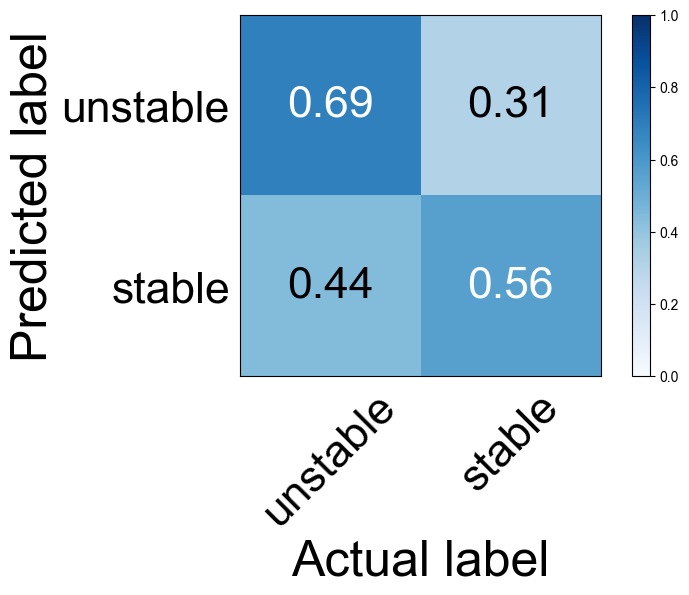

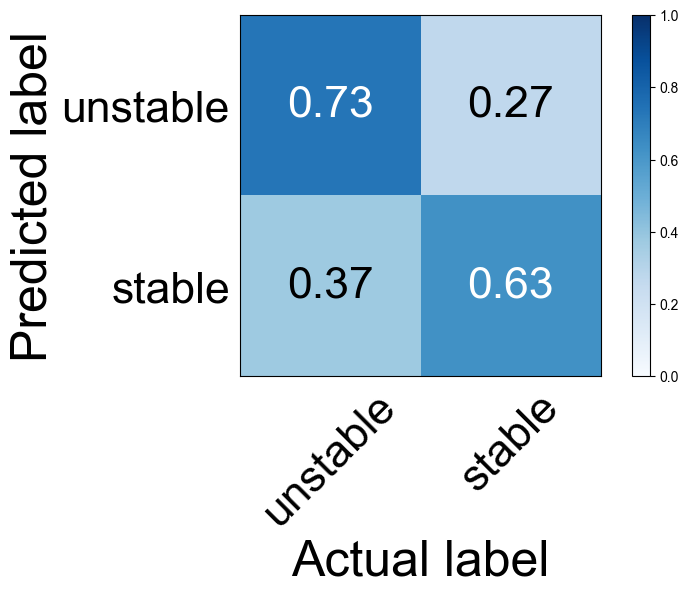

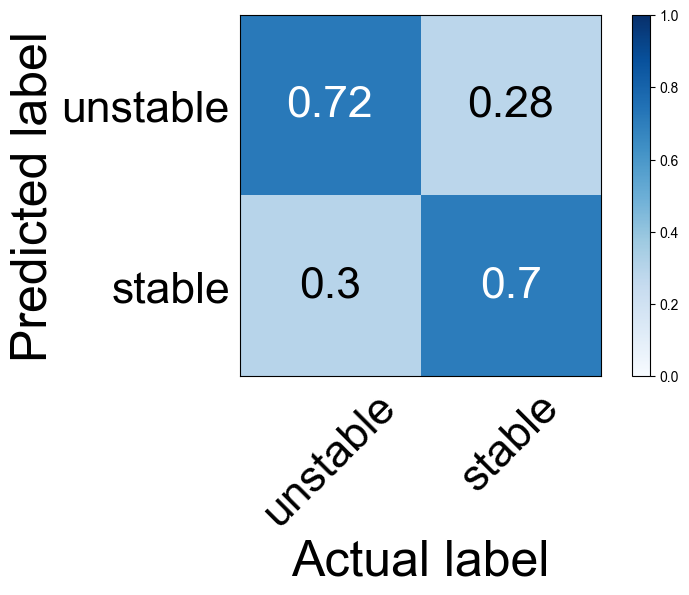

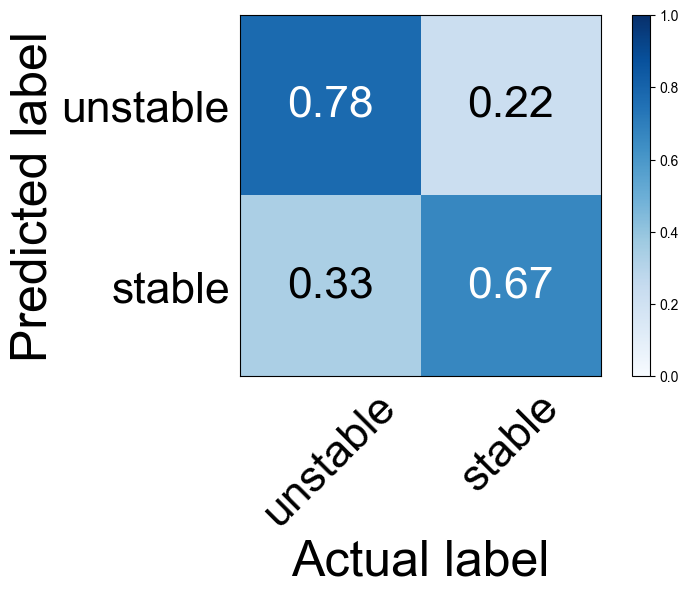

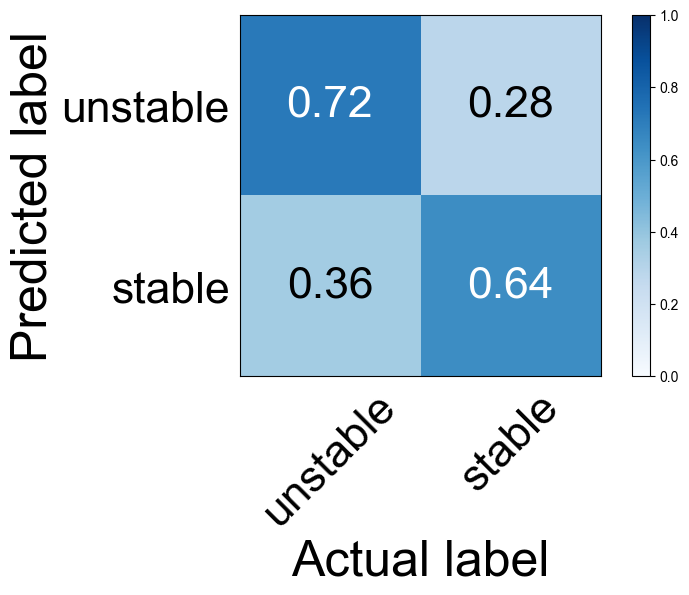

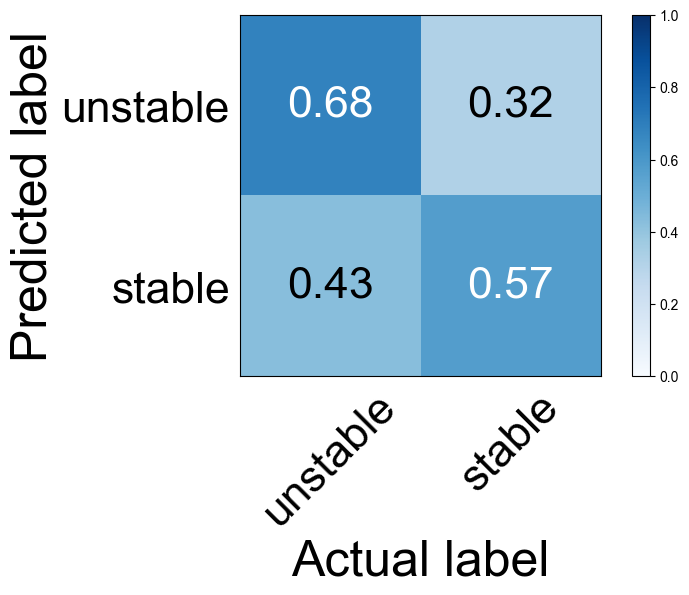

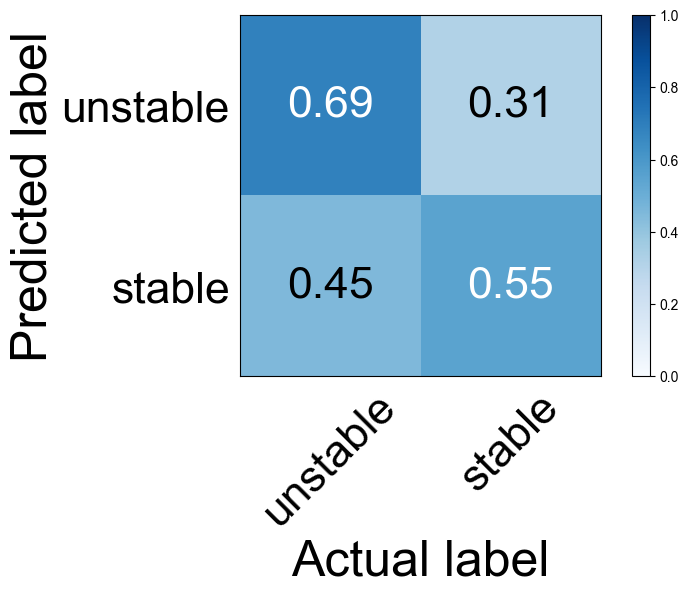

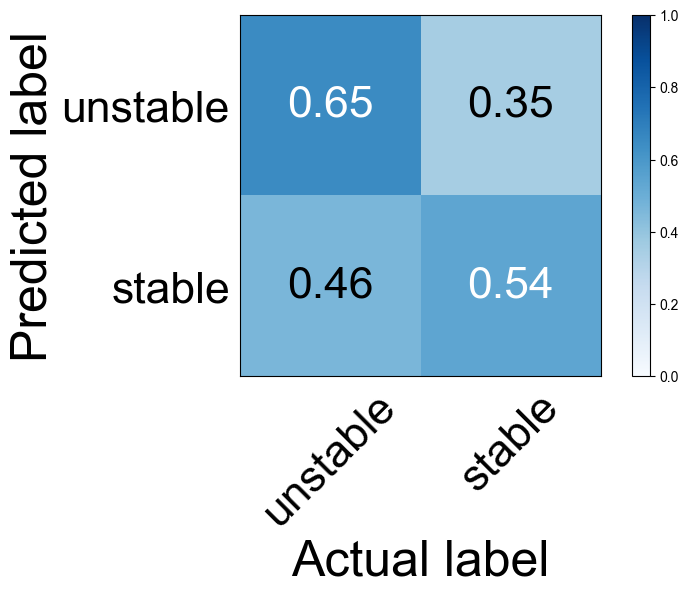

In [ ]:
import matplotlib.pyplot as plt
models_params = {
    "DecisionTree": DecisionTreeClassifier(
        criterion='gini', max_depth=18, min_samples_split=5, min_samples_leaf=3, random_state=42
    ),
    "RandomForest": RandomForestClassifier(
        n_estimators=177, max_depth=9, min_samples_split=7, min_samples_leaf=1, max_features=None, random_state=42
    ),
    "LightGBM": lgb.LGBMClassifier(
        num_leaves=57, max_depth=6, learning_rate=0.08405008246951755, n_estimators=682, min_child_samples=44, random_state=42
    ),
    "CatBoostClassifier": CatBoostClassifier(
        depth=4, learning_rate=0.10854882068847443, l2_leaf_reg= 0.04246341658173898,
        iterations=630, border_count= 233,bagging_temperature=1.4462717441981248,leaf_estimation_iterations= 4,random_strength=3.8154814905707957,random_seed=42, verbose=False
    ),
    "XGBoost": xgb.XGBClassifier(
        max_depth=8, learning_rate=0.1499677543837438, n_estimators=979, subsample=0.6034267875032965, colsample_bytree=0.8001010932616246, gamma=1.498990501280125, max_cat_threshold=10, eval_metric="logloss", random_state=42
    ),
    "MLP": MLPClassifier(
        hidden_layer_sizes=(100,), activation='logistic', solver='adam', alpha=1.3529524268251391e-05, learning_rate='adaptive', random_state=42
    ),
    "KNN": KNeighborsClassifier(
        n_neighbors=16, weights='distance', p=1
    ),
    "SVC": SVC(
        kernel='linear', C=1, gamma='auto', probability=True, random_state=42
    )
}
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42)

# results storage
results = []
plt.rcParams['font.serif'] = ['Times New Roman']

# carry out training and evaluation for each model

for name, model in models_params.items():
    model.fit(X_train, y_train)
    
    # predict on training set
    train_preds = model.predict(X_train)
    train_acc = accuracy_score(y_train, train_preds)
    train_f1 = f1_score(y_train, train_preds, average="weighted")
    
    # predict on test set
    test_preds = model.predict(X_test)
    test_acc = accuracy_score(y_test, test_preds)
    test_f1 = f1_score(y_test, test_preds, average="weighted")

    # draw confusion matrix
    draw_confusion_matrix(
        y_test, test_preds, 
        ['unstable', 'stable'], 
        title=f'Confusion Matrix {name} for stability',
        dpi=300
    )

    plt.savefig(f'./fig_confusion/Confusion Matrix {name} for stability', dpi=300, bbox_inches='tight')
    
    results.append({
        "Model": name,
        "Train_Accuracy": train_acc,
        "Train_F1": train_f1,
        "Test_Accuracy": test_acc,
        "Test_F1": test_f1
    })

# transform results to DataFrame for better visualization
df_results = pd.DataFrame(results)
print(df_results)

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

# add Arial font
arial_path = '~/.local/share/fonts/ARIAL.TTF'
arial_font = fm.FontProperties(fname=arial_path)

# originally set the font globally
fm.fontManager.addfont(arial_path)
plt.rcParams['font.family'] = 'Arial'


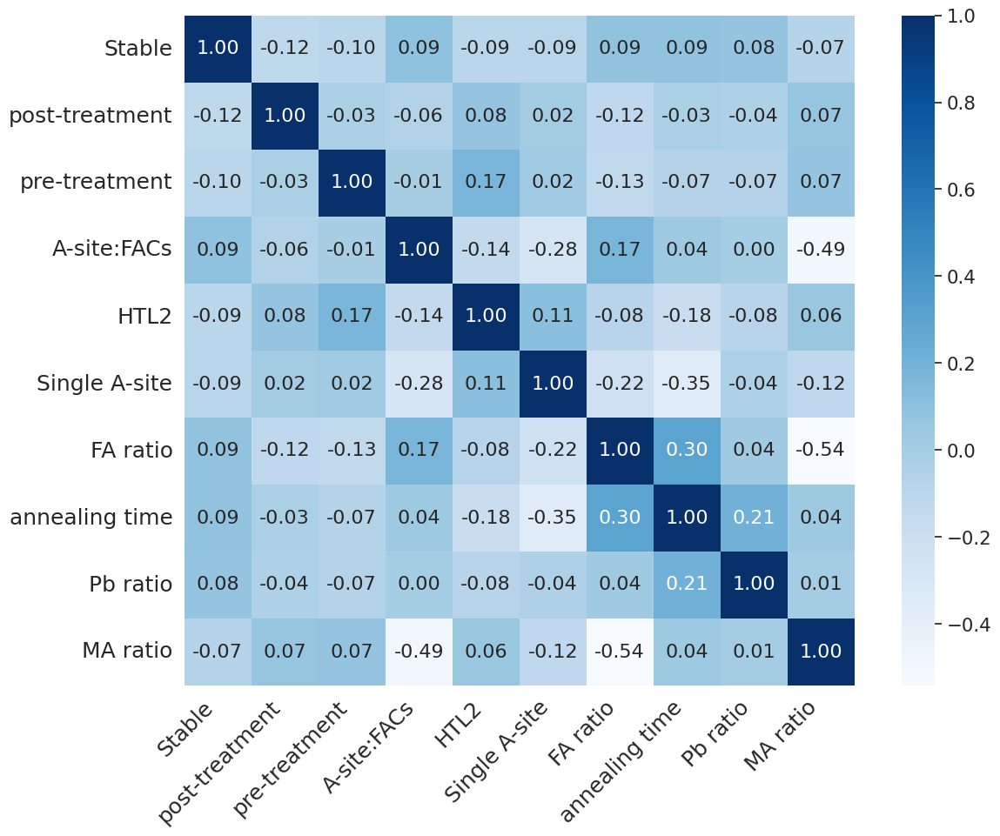

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# calculate the Spearman correlation matrix
mcorr = df_test.corr(method='spearman')

first_feature = mcorr.columns[0]

order = mcorr[first_feature].abs().sort_values(ascending=False).index

top_n = 10
top_features = order[:top_n]

mcorr_top = mcorr.loc[top_features, top_features]

new_labels = [
    "Stable", "post-treatment", "pre-treatment", "A-site:FACs", "HTL2",
    "Single A-site", "FA ratio", "annealing time", "Pb ratio", "MA ratio"
]

mcorr_top.index = new_labels
mcorr_top.columns = new_labels

plt.figure(figsize=(14, 10))
sns.set(font_scale=1.4)
g = sns.heatmap(
    mcorr_top,
    square=True,
    cmap='Blues',
    annot=True,
    fmt='.2f',
    cbar=True,
    annot_kws={"size": 16}
)

plt.xticks(rotation=45, ha='right', fontsize=18)
plt.yticks(rotation=0, fontsize=18)

plt.savefig('heatmap_stability.png', format='png', bbox_inches='tight', dpi=300)
plt.show()


### pce

In [68]:
df_label_pce = df_label_final.drop(labels=['stable'],axis=1)


In [ ]:
X.columns

Index(['FA', 'MA', 'Cs', 'Rb', 'Pb', 'Sn', 'I', 'Br', 'Cl', 'effective_area',
       'anneal_T1', 'anneal_t1', 'anneal_T2', 'anneal_t2', 'encapsulation',
       'thickness', 'deposit_type_Encoded', 'deposit_step_Encoded',
       'anti_solution_Encoded', 'anti_add_Encoded',
       'precursor_solution_Encoded', 'precursor_add_Encoded',
       'structure_Encoded', 'substrate_Encoded', 'electrode_Encoded',
       'ETL_Encoded', 'ETL-2_Encoded', 'ETL_add_Encoded', 'HTL_Encoded',
       'HTL-2_Encoded', 'HTL_add_Encoded', 'up_passive_Encoded',
       'down_passive_Encoded', 'anneal_atmosphere_Encoded', 'Is_FAMACs',
       'Is_FACs', 'double_element', 'Is_FA', 'single_element', 'Is_FAMA',
       'Is_Cs', 'Is_MA', 'tf', 'miu'],
      dtype='object')

In [71]:
X

,FA,MA,Cs,Rb,Pb,Sn,I,Br,Cl,effective_area,...,Is_FAMACs,Is_FACs,double_element,Is_FA,single_element,Is_FAMA,Is_Cs,Is_MA,tf,miu
0,0.85,0.10,0.05,0.00,1.0,0.0,3.00,0.00,0.00,0.04900,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.970136,0.540909
1,0.95,0.00,0.05,0.00,1.0,0.0,3.00,0.00,0.00,0.05700,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.977645,0.540909
2,1.00,0.00,0.00,0.00,1.0,0.0,3.00,0.00,0.00,0.12700,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.986615,0.540909
3,0.95,0.00,0.00,0.05,1.0,0.0,3.00,0.00,0.00,0.07461,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.975664,0.540909
4,0.94,0.00,0.06,0.00,1.0,0.0,3.00,0.00,0.00,0.04900,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.975852,0.540909
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1250,0.95,0.00,0.05,0.00,1.0,0.0,2.94,0.06,0.00,0.05100,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.978029,0.542092
1251,0.80,0.00,0.20,0.00,1.0,0.0,1.89,1.11,0.00,0.04900,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.957291,0.563660
1252,0.80,0.00,0.20,0.00,1.0,0.0,1.89,1.11,0.00,0.04900,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.957291,0.563660
1253,0.63,0.15,0.22,0.00,1.0,0.0,2.49,0.42,0.09,0.05780,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.938985,0.552281


In [69]:
df_label_pce = df_label_pce.drop(labels=['RH','Sun','Temperature','ISOS-test_type'],axis=1)
df_label_pce=df_label_pce.drop_duplicates()
df_label_pce=df_label_pce.reset_index(drop=True)

In [70]:
y = df_label_pce['pce_max']
X = df_label_pce.drop(labels=['pce_max'],axis=1)

In [72]:
import optuna
import pandas as pd
import numpy as np
from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import load_diabetes

In [ ]:
import optuna
import pandas as pd
import numpy as np
from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import load_diabetes
from sklearn.svm import SVR



kf = KFold(n_splits=5, shuffle=True, random_state=42)

def objective_lr(trial):
    params = {
        "alpha": trial.suggest_float("alpha", 1e-3, 100.0, log=True),
        "solver": trial.suggest_categorical("solver", ["auto", "svd", "cholesky", "lsqr", "sparse_cg", "saga"])
    }
    model = Ridge(**params, random_state=42)
    score = cross_val_score(model, X, y, cv=kf, scoring="neg_root_mean_squared_error").mean()
    return score

def objective_svr(trial):
    params = {
        "C": trial.suggest_float("C", 0.1, 100.0, log=True),
        "kernel": trial.suggest_categorical("kernel", ["linear", "rbf", "poly"]),
        "gamma": trial.suggest_float("gamma", 1e-4, 1e-1, log=True),
        "degree": trial.suggest_int("degree", 2, 4),
        "epsilon": trial.suggest_float("epsilon", 1e-3, 0.5, log=True),
        "tol": trial.suggest_float("tol", 1e-4, 1e-2, log=True)
    }
    

    if params["kernel"] != "poly":
        params.pop("degree")
    
    if params["kernel"] == "linear":
        params.pop("gamma")
    
    model = SVR(**params)
    scores = cross_val_score(model, X, y, cv=kf, scoring="neg_root_mean_squared_error")
    return scores.mean()

def objective_dt(trial):
    params = {
        "max_depth": trial.suggest_int("max_depth", 2, 50),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 20),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 20)
    }
    model = DecisionTreeRegressor(**params, random_state=42)
    score = cross_val_score(model, X, y, cv=kf, scoring="neg_root_mean_squared_error").mean()
    return score

def objective_rf(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 50, 500),
        "max_depth": trial.suggest_int("max_depth", 2, 50),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 20),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 20),
        "max_features": trial.suggest_categorical("max_features", ["sqrt", "log2", None])
    }
    model = RandomForestRegressor(**params, random_state=42, n_jobs=-1)
    score = cross_val_score(model, X, y, cv=kf, scoring="neg_root_mean_squared_error").mean()
    return score

def objective_lgbm(trial):
    params = {
        "num_leaves": trial.suggest_int("num_leaves", 20, 150),
        "max_depth": trial.suggest_int("max_depth", -1, 50),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.3, log=True),
        "n_estimators": trial.suggest_int("n_estimators", 50, 1000),
        "min_child_samples": trial.suggest_int("min_child_samples", 5, 100)
    }
    model = LGBMRegressor(**params, random_state=42, n_jobs=-1)
    score = cross_val_score(model, X, y, cv=kf, scoring="neg_root_mean_squared_error").mean()
    return score

def objective_catboost(trial):
    params = {
        "depth": trial.suggest_int("depth", 3, 12),  
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=True),
        "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1e-3, 10.0, log=True),
        "iterations": trial.suggest_int("iterations", 100, 1000),
        "border_count": trial.suggest_int("border_count", 32, 254),  
        "bagging_temperature": trial.suggest_float("bagging_temperature", 0.0, 1.0),  
        "random_strength": trial.suggest_float("random_strength", 1e-3, 10.0, log=True),  
        "leaf_estimation_iterations": trial.suggest_int("leaf_estimation_iterations", 1, 10)  
    }
    
    model = CatBoostRegressor(**params, random_seed=42, verbose=False)
    score = cross_val_score(model, X, y, cv=kf, scoring="neg_root_mean_squared_error").mean()
    return score

def objective_xgb(trial):
    params = {
        "max_depth": trial.suggest_int("max_depth", 3, 12),  
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=True),  
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000),
        "subsample": trial.suggest_float("subsample", 0.6, 1.0), 
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0), 
        "gamma": trial.suggest_float("gamma", 0, 10),  
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 20),  
        "reg_alpha": trial.suggest_float("reg_alpha", 1e-8, 1.0, log=True),  
        "reg_lambda": trial.suggest_float("reg_lambda", 1e-8, 1.0, log=True)  
    }
    
    model = XGBRegressor(**params, random_state=42, n_jobs=-1)
    score = cross_val_score(model, X, y, cv=kf, scoring="neg_root_mean_squared_error").mean()
    return score


def objective_mlp(trial):

    hidden_layer_sizes = trial.suggest_categorical("hidden_layer_sizes", [
        (50,), (100,), (150,),    
        (100, 50), (150, 100),         
        (150, 100, 50)                  
    ])
    
    params = {
        "hidden_layer_sizes": hidden_layer_sizes,
        "activation": trial.suggest_categorical("activation", ["relu", "tanh"]),
        "solver": "adam",
        "alpha": trial.suggest_float("alpha", 1e-5, 1e-2, log=True),  
        "learning_rate_init": trial.suggest_float("learning_rate_init", 1e-4, 1e-2, log=True),
        "max_iter": 500, 
        "early_stopping": True,
        "validation_fraction": 0.15,
        "n_iter_no_change": 20 
    }
    
    model = MLPRegressor(**params, random_state=42)
    score = cross_val_score(model, X, y, cv=kf, scoring="neg_root_mean_squared_error").mean()
    return score


models = {
    "Ridge": objective_lr,
    "SVR": objective_svr,
    "DecisionTreeRegressor": objective_dt,
    "RandomForestRegressor": objective_rf,
    "LGBMRegressor": objective_lgbm,
    "CatBoostRegressor": objective_catboost,
    "XGBRegressor": objective_xgb,
    "MLPRegressor": objective_mlp
}

results = {}
for name, obj in models.items():
    print(f"\n optimize {name} ...")
    study = optuna.create_study(direction="maximize")
    study.optimize(obj, n_trials=20, show_progress_bar=True) 
    results[name] = {
        "best_score_negRMSE": study.best_value,
        "best_RMSE": -study.best_value,
        "best_params": study.best_params
    }

print("\n Hyperparameter optimization results (the smaller the RMSE, the better)：")
for name, res in results.items():
    print(f"\n{name}:")
    print(f"  Best 5-decimal mean RMSE: {res['best_RMSE']:.4f}")
    print(f"  Best Hyperparameter: {res['best_params']}")

[I 2025-09-09 09:48:48,690] A new study created in memory with name: no-name-7e169e80-ec6a-42e5-86e8-d88968739ac2



🔍 优化 MLPRegressor 中...


  0%|          | 0/20 [00:00<?, ?it/s]

/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (150,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of 

[I 2025-09-09 09:49:05,589] Trial 0 finished with value: -0.05916104538502679 and parameters: {'hidden_layer_sizes': (150, 100, 50), 'activation': 'tanh', 'alpha': 0.009659703902285327, 'learning_rate_init': 0.0002539970796000905}. Best is trial 0 with value: -0.05916104538502679.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (150,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of 

[I 2025-09-09 09:49:24,688] Trial 1 finished with value: -0.5205823937808116 and parameters: {'hidden_layer_sizes': (100, 50), 'activation': 'relu', 'alpha': 0.0001283829904218617, 'learning_rate_init': 0.00026483706814601956}. Best is trial 0 with value: -0.05916104538502679.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/zx/anaconda3/e

[I 2025-09-09 09:49:34,086] Trial 2 finished with value: -1.0324421633360517 and parameters: {'hidden_layer_sizes': (50,), 'activation': 'relu', 'alpha': 7.943379458208783e-05, 'learning_rate_init': 0.0001861367194525009}. Best is trial 0 with value: -0.05916104538502679.
[I 2025-09-09 09:49:37,190] Trial 3 finished with value: -0.06167465590409239 and parameters: {'hidden_layer_sizes': (150,), 'activation': 'tanh', 'alpha': 1.3427421741923091e-05, 'learning_rate_init': 0.008308657888009505}. Best is trial 0 with value: -0.05916104538502679.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (150,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of 

[I 2025-09-09 09:49:40,147] Trial 4 finished with value: -0.045731561556176525 and parameters: {'hidden_layer_sizes': (50,), 'activation': 'tanh', 'alpha': 3.976311084764042e-05, 'learning_rate_init': 0.006259608817876749}. Best is trial 4 with value: -0.045731561556176525.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (150,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of 

[I 2025-09-09 09:49:47,165] Trial 5 finished with value: -0.13752593839254884 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'tanh', 'alpha': 7.612674946556365e-05, 'learning_rate_init': 0.001138813457668537}. Best is trial 4 with value: -0.045731561556176525.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (150,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of 

[I 2025-09-09 09:49:50,787] Trial 6 finished with value: -0.11877582453645052 and parameters: {'hidden_layer_sizes': (150,), 'activation': 'tanh', 'alpha': 1.9055293903573302e-05, 'learning_rate_init': 0.003652049813201875}. Best is trial 4 with value: -0.045731561556176525.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (150,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of 

[I 2025-09-09 09:49:59,470] Trial 7 finished with value: -0.16543154834057827 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'tanh', 'alpha': 5.284541908075819e-05, 'learning_rate_init': 0.0003064371202759343}. Best is trial 4 with value: -0.045731561556176525.
[I 2025-09-09 09:50:15,867] Trial 8 finished with value: -0.3455870680288376 and parameters: {'hidden_layer_sizes': (150, 100), 'activation': 'relu', 'alpha': 7.341659906078218e-05, 'learning_rate_init': 0.0012086114644565455}. Best is trial 4 with value: -0.045731561556176525.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (150,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of 

[I 2025-09-09 09:50:20,408] Trial 9 finished with value: -0.05407523675197673 and parameters: {'hidden_layer_sizes': (150,), 'activation': 'tanh', 'alpha': 0.0002044134357769425, 'learning_rate_init': 0.0098796633810449}. Best is trial 4 with value: -0.045731561556176525.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (150,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of 

[I 2025-09-09 09:50:27,242] Trial 10 finished with value: -0.4285036738205835 and parameters: {'hidden_layer_sizes': (50,), 'activation': 'relu', 'alpha': 0.0011640245383736463, 'learning_rate_init': 0.003545471810267955}. Best is trial 4 with value: -0.045731561556176525.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (150,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of 

[I 2025-09-09 09:50:30,983] Trial 11 finished with value: -0.051144931430912456 and parameters: {'hidden_layer_sizes': (150,), 'activation': 'tanh', 'alpha': 0.0008531648086936909, 'learning_rate_init': 0.00990400668475629}. Best is trial 4 with value: -0.045731561556176525.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (150,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of 

[I 2025-09-09 09:50:34,712] Trial 12 finished with value: -0.06804967858255018 and parameters: {'hidden_layer_sizes': (50,), 'activation': 'tanh', 'alpha': 0.0010404113283572925, 'learning_rate_init': 0.0036725619942682784}. Best is trial 4 with value: -0.045731561556176525.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (150,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of 

[I 2025-09-09 09:50:37,876] Trial 13 finished with value: -0.04664194037187987 and parameters: {'hidden_layer_sizes': (100, 50), 'activation': 'tanh', 'alpha': 0.0005824266913898587, 'learning_rate_init': 0.005634499326366768}. Best is trial 4 with value: -0.045731561556176525.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (150,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of 

[I 2025-09-09 09:50:42,102] Trial 14 finished with value: -0.06873277764530476 and parameters: {'hidden_layer_sizes': (100, 50), 'activation': 'tanh', 'alpha': 0.00044551794150806957, 'learning_rate_init': 0.002125891013364486}. Best is trial 4 with value: -0.045731561556176525.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (150,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of 

[I 2025-09-09 09:50:49,631] Trial 15 finished with value: -0.09432909700986578 and parameters: {'hidden_layer_sizes': (100, 50), 'activation': 'tanh', 'alpha': 0.0036144591790150745, 'learning_rate_init': 0.0005357170106874984}. Best is trial 4 with value: -0.045731561556176525.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (150,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of 

[I 2025-09-09 09:51:08,657] Trial 16 finished with value: -0.08377585211489563 and parameters: {'hidden_layer_sizes': (150, 100), 'activation': 'tanh', 'alpha': 3.1808112794225116e-05, 'learning_rate_init': 0.00010033559477287655}. Best is trial 4 with value: -0.045731561556176525.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (150,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of 

[I 2025-09-09 09:51:16,140] Trial 17 finished with value: -0.030760466874090526 and parameters: {'hidden_layer_sizes': (150, 100, 50), 'activation': 'tanh', 'alpha': 0.0002547789782329798, 'learning_rate_init': 0.0054034643757590204}. Best is trial 17 with value: -0.030760466874090526.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (150,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of 

[I 2025-09-09 09:51:34,002] Trial 18 finished with value: -0.14897064064983356 and parameters: {'hidden_layer_sizes': (150, 100, 50), 'activation': 'relu', 'alpha': 0.00026432292490186776, 'learning_rate_init': 0.002185242451649447}. Best is trial 17 with value: -0.030760466874090526.


/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (50,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (100,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (150,) which is of type tuple.
  warnings.warn(message)
/home/zx/anaconda3/envs/ml/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of 

[I 2025-09-09 09:51:41,069] Trial 19 finished with value: -0.043504095639275805 and parameters: {'hidden_layer_sizes': (150, 100, 50), 'activation': 'tanh', 'alpha': 2.847350648619865e-05, 'learning_rate_init': 0.00198784766326276}. Best is trial 17 with value: -0.030760466874090526.

📊 超参数优化结果（RMSE 越小越好）：

MLPRegressor:
  最佳5折均值RMSE: 0.0308
  最佳参数: {'hidden_layer_sizes': (150, 100, 50), 'activation': 'tanh', 'alpha': 0.0002547789782329798, 'learning_rate_init': 0.0054034643757590204}


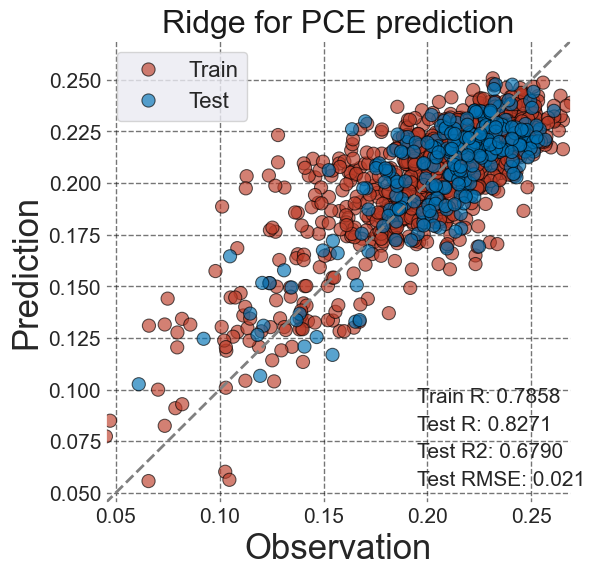

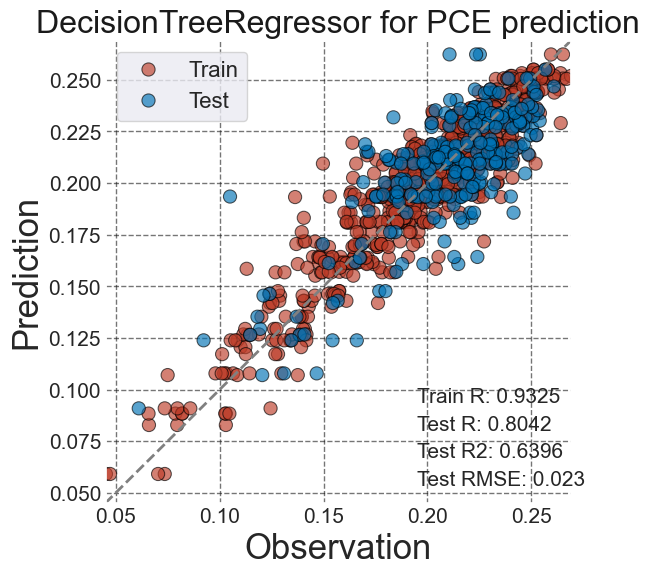

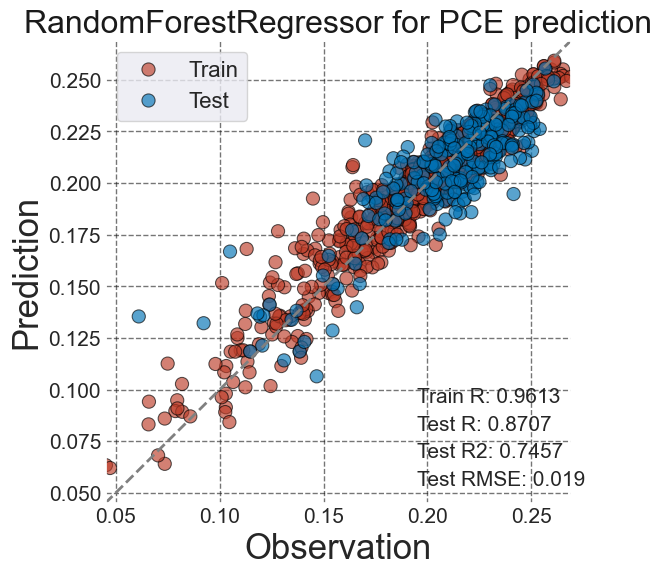

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000508 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 893
[LightGBM] [Info] Number of data points in the train set: 1004, number of used features: 44
[LightGBM] [Info] Start training from score 0.203098
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


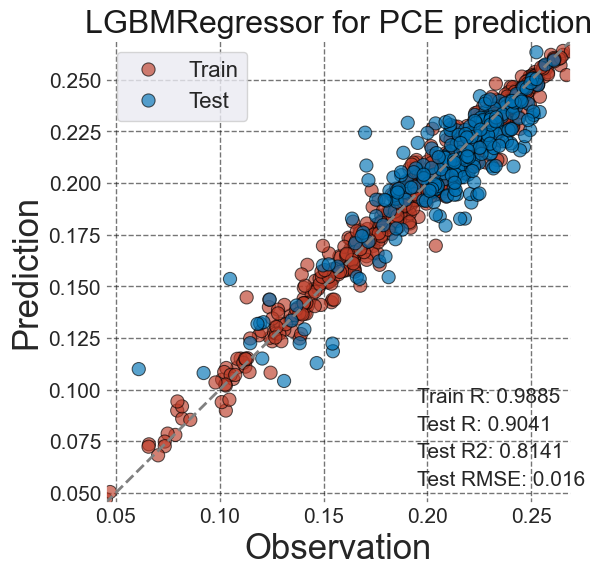

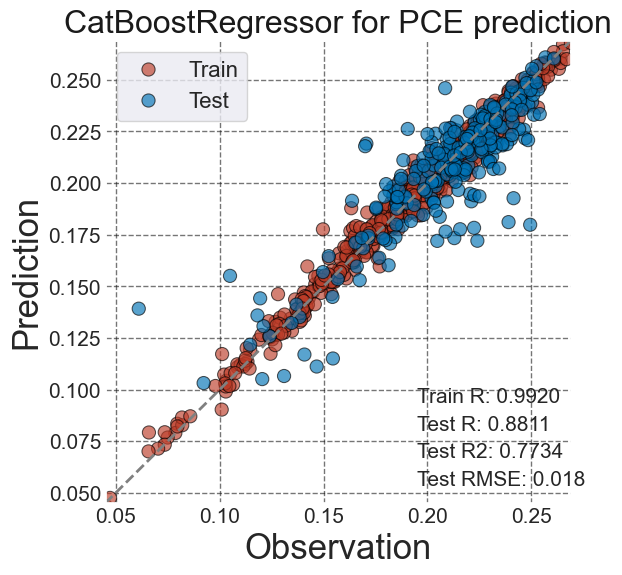

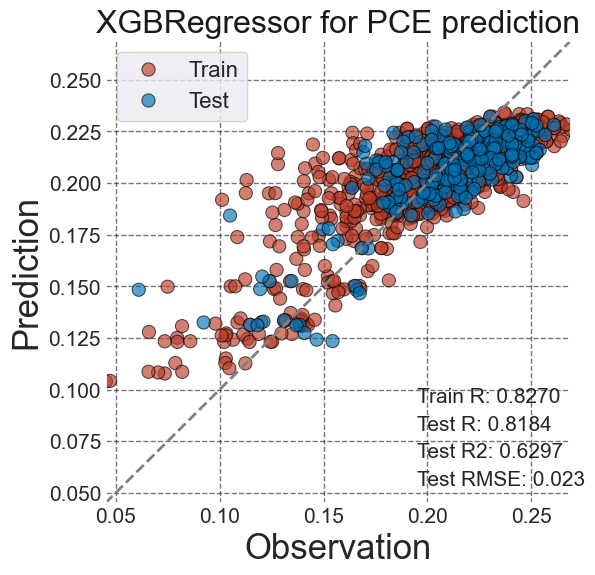

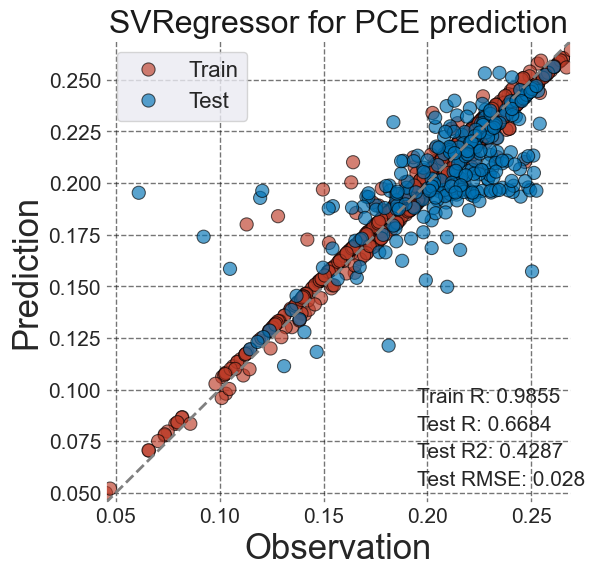

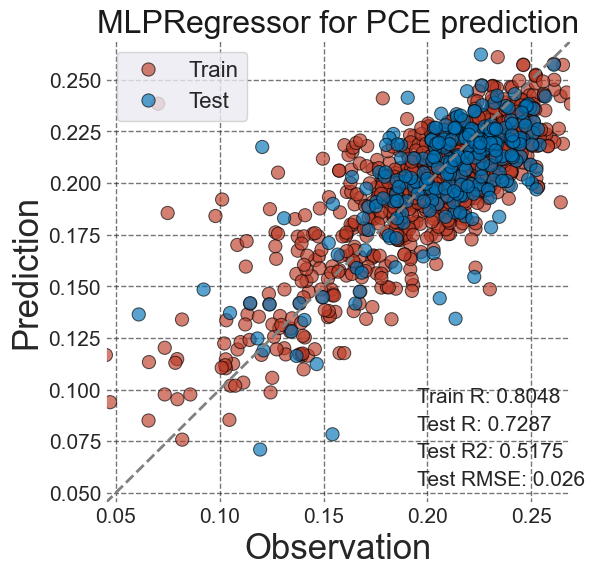

                   Model  Train_RMSE  Train_R2  Test_RMSE   Test_R2
0                  Ridge    0.022853  0.617415   0.021299  0.679017
1  DecisionTreeRegressor    0.013345  0.869541   0.022569  0.639581
2  RandomForestRegressor    0.010414  0.920544   0.018957  0.745714
3          LGBMRegressor    0.005601  0.977015   0.016207  0.814148
4      CatBoostRegressor    0.004717  0.983697   0.017896  0.773395
5           XGBRegressor    0.021677  0.655774   0.022875  0.629749
6            SVRegressor    0.006543  0.968640   0.028415  0.428669
7           MLPRegressor    0.022091  0.642499   0.026113  0.517522


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, r2_score
from letsplot import *


# split the dataset
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42)

# define models with best hyperparameters
models = {
    "Ridge": Ridge(
        alpha=0.001006730938613721, solver='svd'
    ),
    "DecisionTreeRegressor": DecisionTreeRegressor(
        max_depth=12, min_samples_split=10, min_samples_leaf=2, random_state=42
    ),
    "RandomForestRegressor": RandomForestRegressor(
        n_estimators=52, max_depth=39, min_samples_split=3, min_samples_leaf=2,
        max_features=None, random_state=42, n_jobs=-1
    ),
    "LGBMRegressor": LGBMRegressor(
        num_leaves=30, max_depth=21, learning_rate=0.03855308077353888,
        n_estimators=965, min_child_samples=20, random_state=42, n_jobs=-1
    ),
    "CatBoostRegressor": CatBoostRegressor(
        depth=4, learning_rate=0.29787323009618716, l2_leaf_reg=1.1026999346081447,
        iterations=730, border_count=236, bagging_temperature=4.117516010810216,
        random_strength=3.3172475116399216, leaf_estimation_iterations=1,
        random_seed=42, verbose=False
    ),
    "XGBRegressor": XGBRegressor(
        max_depth=8, learning_rate=0.024035585136161875, n_estimators=688,
        subsample=0.6301087549564868, colsample_bytree=0.6700989715185162,
        gamma=0.011590381829954616, min_child_weight=14,
        reg_alpha=0.001380838760409068, reg_lambda=4.88734497805848e-08,
        random_state=42, n_jobs=-1
    ),
    "SVRegressor": SVR(
    kernel="rbf",C=3.5675,epsilon=0.00463,gamma=0.00266
    ),
    "MLPRegressor": MLPRegressor(
        hidden_layer_sizes=(150,100,50),activation='tanh',solver='adam',max_iter=500,early_stopping=True,validation_fraction=0.15,n_iter_no_change=20,alpha=0.0002547789782329798,learning_rate_init=0.0054034643757590204,
        random_state=42
    )

}

# results storage
results = []

# carry out training and evaluation for each model
for name, model in models.items():
    model.fit(X_train, y_train)

    # training set
    train_preds = model.predict(X_train)
    train_rmse = np.sqrt(mean_squared_error(y_train, train_preds))
    train_r2 = r2_score(y_train, train_preds)

    # test set
    test_preds = model.predict(X_test)
    test_rmse = np.sqrt(mean_squared_error(y_test, test_preds))
    test_r2 = r2_score(y_test, test_preds)

    myscatterplot2(
        y_train, train_preds,
        y_test, test_preds,
        modelname=name,
        target="PCE",
        plot_height=6,
        savepic=True,
        picname=f"./fig_pce/{name.lower()}_pce_prediction"
    )

    
    results.append({
        "Model": name,
        "Train_RMSE": train_rmse,
        "Train_R2": train_r2,
        "Test_RMSE": test_rmse,
        "Test_R2": test_r2
    })

# transform results to DataFrame for better visualization
df_results = pd.DataFrame(results)
print(df_results)

In [ ]:
import pandas as pd
import numpy as np
from catboost import CatBoostRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split


X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)


cat_model = CatBoostRegressor(
    depth=4, learning_rate=0.29787323009618716, l2_leaf_reg=1.1026999346081447,
    iterations=730, border_count=236, bagging_temperature=4.117516010810216,
    random_strength=3.3172475116399216, leaf_estimation_iterations=1,
    random_seed=42, verbose=False
)


cat_model.fit(X_train, y_train)


y_train_pred = cat_model.predict(X_train)
y_test_pred = cat_model.predict(X_test)


train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
train_r2 = r2_score(y_train, y_train_pred)

test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)

print(f"Train RMSE: {train_rmse:.4f}, R²: {train_r2:.4f}")
print(f"Test RMSE: {test_rmse:.4f}, R²: {test_r2:.4f}")


df_train_out = pd.DataFrame({
    "y_train": y_train,
    "y_train_pred": y_train_pred
})
df_train_out.to_excel("catboost_train_predictions.xlsx", index=False)


df_test_out = pd.DataFrame({
    "y_test": y_test,
    "y_test_pred": y_test_pred
})
df_test_out.to_excel("catboost_test_predictions.xlsx", index=False)

print("The prediction results of the training set and the test set have been saved as CSV files！")


Train RMSE: 0.0047, R²: 0.9837
Test RMSE: 0.0179, R²: 0.7734
✅ 训练集和测试集预测结果已保存为 CSV 文件！


In [81]:
from sklearn.model_selection import KFold, cross_val_score
import numpy as np
from sklearn.linear_model import Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
import pandas as pd

# 你给的模型参数
models = {
    "Ridge": Ridge(
        alpha=0.001006730938613721, solver='svd'
    ),
    "DecisionTreeRegressor": DecisionTreeRegressor(
        max_depth=12, min_samples_split=10, min_samples_leaf=2, random_state=42
    ),
    "RandomForestRegressor": RandomForestRegressor(
        n_estimators=52, max_depth=39, min_samples_split=3, min_samples_leaf=2,
        max_features=None, random_state=42, n_jobs=-1
    ),
    "LGBMRegressor": LGBMRegressor(
        num_leaves=30, max_depth=21, learning_rate=0.03855308077353888,
        n_estimators=965, min_child_samples=20, random_state=42, n_jobs=-1
    ),
    "CatBoostRegressor": CatBoostRegressor(
        depth=4, learning_rate=0.29787323009618716, l2_leaf_reg=1.1026999346081447,
        iterations=730, border_count=236, bagging_temperature=4.117516010810216,
        random_strength=3.3172475116399216, leaf_estimation_iterations=1,
        random_seed=42, verbose=False
    ),
    "XGBRegressor": XGBRegressor(
        max_depth=8, learning_rate=0.024035585136161875, n_estimators=688,
        subsample=0.6301087549564868, colsample_bytree=0.6700989715185162,
        gamma=0.011590381829954616, min_child_weight=14,
        reg_alpha=0.001380838760409068, reg_lambda=4.88734497805848e-08,
        random_state=42, n_jobs=-1
    ),
    "SVRegressor": SVR(
        kernel="rbf", C=3.5675, epsilon=0.00463, gamma=0.00266
    ),
    "MLPRegressor": MLPRegressor(
        hidden_layer_sizes=(150,100,50),
        activation='tanh',
        solver='adam',
        max_iter=500,
        early_stopping=True,
        validation_fraction=0.15,
        n_iter_no_change=20,
        alpha=0.0002547789782329798,
        learning_rate_init=0.0054034643757590204,
        random_state=42
    )

}

# 设置 KFold
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 存储结果
results = []

for name, model in models.items():
    scores = cross_val_score(
        model, X, y, cv=kf, scoring="neg_root_mean_squared_error"
    )
    rmse_scores = -scores  # 转为正的RMSE
    results.append({
        "Model": name,
        "Mean_RMSE": rmse_scores.mean(),
        "Std_RMSE": rmse_scores.std()
    })

# 转为 DataFrame 方便查看
df_results = pd.DataFrame(results)
print(df_results)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 893
[LightGBM] [Info] Number of data points in the train set: 1004, number of used features: 44
[LightGBM] [Info] Start training from score 0.203098
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000723 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 898
[LightGBM] [Info] Number of data points in the train set: 1004, number of used features: 44
[LightGBM] [Info] Start training from score 0.203800
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGB

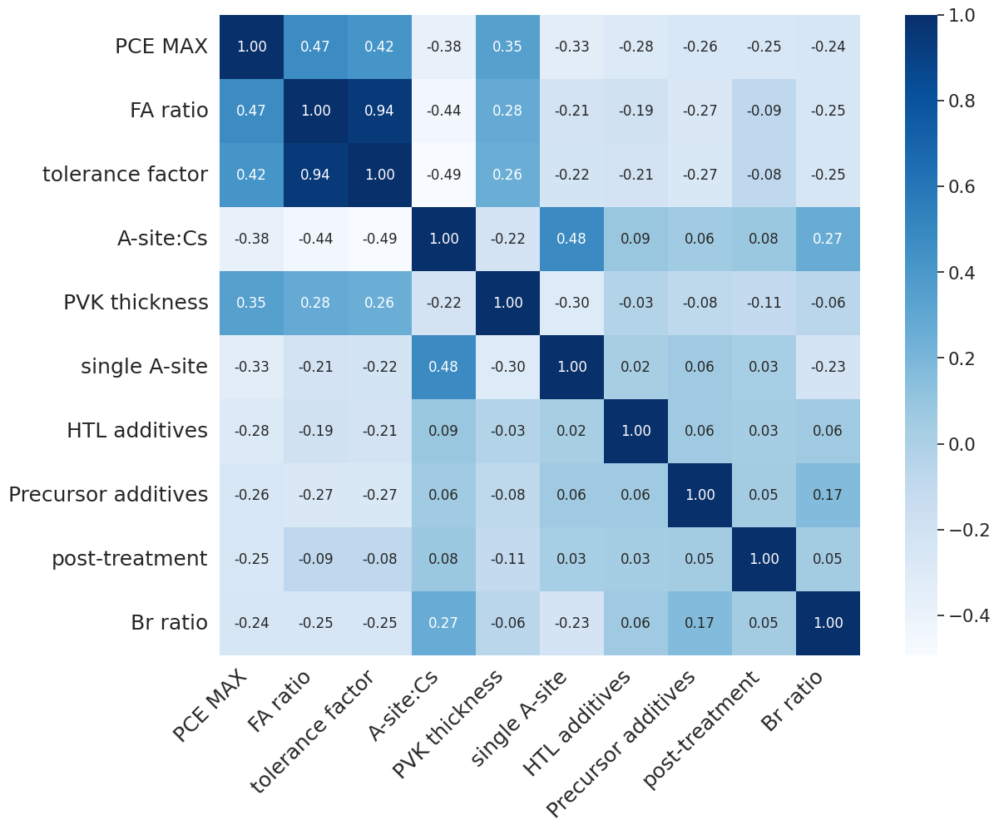

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# calculate the Spearman correlation matrix
mcorr = df_label_pce.corr(method='spearman')

first_feature = mcorr.columns[0]

order = mcorr[first_feature].abs().sort_values(ascending=False).index

top_n = 10
top_features = order[:top_n]

mcorr_top = mcorr.loc[top_features, top_features]

new_labels = [
    "PCE MAX", "FA ratio", "tolerance factor", "A-site:Cs", "PVK thickness",
    "single A-site", "HTL additives", "Precursor additives", "post-treatment", "Br ratio"
]
mcorr_top.index = new_labels
mcorr_top.columns = new_labels

plt.figure(figsize=(14, 10))
sns.set(font_scale=1.4)
g = sns.heatmap(
    mcorr_top,
    square=True,
    cmap='Blues',
    annot=True,
    fmt='.2f',
    cbar=True,
    annot_kws={"size": 12}
)

plt.xticks(rotation=45, ha='right', fontsize=18)
plt.yticks(rotation=0, fontsize=18)

plt.savefig('heatmap_pce.png', format='png', bbox_inches='tight', dpi=300)
plt.show()
